# **For this notebook to run with updated APIs, we need torch 1.12+ and torchvision 0.13+**

In [1]:
try:
    import torch
    import torchvision
    assert int(torch.__version__.split(".")[1]) >= 12 or int(torch.__version__.split(".")[0]) == 2, "torch version should be 1.12+"
    assert int(torchvision.__version__.split(".")[1]) >= 13, "torchvision version should be 0.13+"
    print(f"torch version: {torch.__version__}")
    print(f"torchvision version: {torchvision.__version__}")
except:
    print(f"[INFO] torch/torchvision versions not as required, installing nightly versions.")
    !pip3 install -U torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cu118
    import torch
    import torchvision
    print(f"torch version: {torch.__version__}")
    print(f"torchvision version: {torchvision.__version__}")

torch version: 2.4.0+cu121
torchvision version: 0.19.0+cu121


In [2]:
import matplotlib.pyplot as plt
import torch
import torchvision

from torch import nn
from torchvision import transforms

# Try to get torchinfo, install it if it doesn't work
try:
    from torchinfo import summary
except:
    print("[INFO] Couldn't find torchinfo... installing it.")
    !pip install -q torchinfo
    from torchinfo import summary

[INFO] Couldn't find torchinfo... installing it.


In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive




#**BELOW is the DATASET LINK**

[link text](https://)www.kaggle.com/datasets/mohamedhanyyy/chest-ctscan-images


In [4]:
import zipfile

# Get the path to the zip file
zip_path = "/content/drive/MyDrive/Copy of ct Scan.zip"

# Create a directory to extract the files to
extract_dir = "/content/ct_scan"

# Extract the files from the zip archive
with zipfile.ZipFile(zip_path, "r") as zip_ref:
    zip_ref.extractall(extract_dir)

In [5]:
img_path ="/content/ct_scan/Data"

In [6]:
train_dir = img_path + "/train"
test_dir = img_path + "/test"
valid_dir = img_path + "/valid"

train_dir,test_dir,valid_dir

('/content/ct_scan/Data/train',
 '/content/ct_scan/Data/test',
 '/content/ct_scan/Data/valid')

In [7]:
import os
len(os.listdir(train_dir))

4

In [8]:
import os

image_count = 0
for root, dirs, files in os.walk(img_path):
    for file in files:
        if file.endswith(".png"):
            image_count += 1

print(image_count)

988


In [9]:
len(train_dir),len(test_dir),len(valid_dir)

(27, 26, 27)

In [10]:
import os
def walk_through_dir(dir_path):
  """
  Walks through dir_path returning its contents.
  Args:
    dir_path (str or pathlib.Path): target directory

  Returns:
    A print out of:
      number of subdiretories in dir_path
      number of images (files) in each subdirectory
      name of each subdirectory
  """
  for dirpath, dirnames, filenames in os.walk(dir_path):
    print(f"There are {len(dirnames)} directories and {len(filenames)} images in '{dirpath}'.")

In [11]:
walk_through_dir(img_path)

There are 3 directories and 0 images in '/content/ct_scan/Data'.
There are 4 directories and 0 images in '/content/ct_scan/Data/test'.
There are 0 directories and 90 images in '/content/ct_scan/Data/test/squamous.cell.carcinoma'.
There are 0 directories and 51 images in '/content/ct_scan/Data/test/large.cell.carcinoma'.
There are 0 directories and 120 images in '/content/ct_scan/Data/test/adenocarcinoma'.
There are 0 directories and 54 images in '/content/ct_scan/Data/test/normal'.
There are 4 directories and 0 images in '/content/ct_scan/Data/valid'.
There are 0 directories and 23 images in '/content/ct_scan/Data/valid/adenocarcinoma_left.lower.lobe_T2_N0_M0_Ib'.
There are 0 directories and 21 images in '/content/ct_scan/Data/valid/large.cell.carcinoma_left.hilum_T2_N2_M0_IIIa'.
There are 0 directories and 13 images in '/content/ct_scan/Data/valid/normal'.
There are 0 directories and 15 images in '/content/ct_scan/Data/valid/squamous.cell.carcinoma_left.hilum_T1_N2_M0_IIIa'.
There are

In [12]:
import random
from PIL import Image
from pathlib import Path
import numpy as np

# Set seed
random.seed(42)

# 1. Get all image paths (* means "any combination")
img_path = Path(img_path)
image_path_list = list(img_path.glob("*/*/*.png"))

# 2. Get random image path
random_image_path = random.choice(image_path_list)

# 3. Get image class from path name (the image class is the name of the directory where the image is stored)
image_class = random_image_path.parent.stem

# 4. Open image
img = Image.open(random_image_path)

# 5. Print metadata
print(f"Random image path: {random_image_path}")
print(f"Image class: {image_class}")
print(f"Image height: {img.height}")
print(f"Image width: {img.width}")
img
img_array = np.array(img)
print(f"Image shape: {img_array.shape}")

Random image path: /content/ct_scan/Data/train/large.cell.carcinoma_left.hilum_T2_N2_M0_IIIa/000003 (4).png
Image class: large.cell.carcinoma_left
Image height: 260
Image width: 443
Image shape: (260, 443, 4)



# **Implementation of ViT architecture**

In [13]:
# Create image size (from Table 3 in the ViT paper)
IMG_SIZE = 224

# Create transform pipeline manually
manual_transforms = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
])
print(f"Manually created transforms: {manual_transforms}")

Manually created transforms: Compose(
    Resize(size=(224, 224), interpolation=bilinear, max_size=None, antialias=True)
    ToTensor()
)


In [14]:
import os

from torchvision import datasets, transforms
from torch.utils.data import DataLoader

NUM_WORKERS = os.cpu_count()

def create_dataloaders(
    train_dir: str,
    test_dir: str,
    transform: transforms.Compose,
    batch_size: int,
    num_workers: int=NUM_WORKERS
):
  """Creates training and testing DataLoaders.

  Takes in a training directory and testing directory path and turns
  them into PyTorch Datasets and then into PyTorch DataLoaders.

  Args:
    train_dir: Path to training directory.
    test_dir: Path to testing directory.
    transform: torchvision transforms to perform on training and testing data.
    batch_size: Number of samples per batch in each of the DataLoaders.
    num_workers: An integer for number of workers per DataLoader.

  Returns:
    A tuple of (train_dataloader, test_dataloader, class_names).
    Where class_names is a list of the target classes.
    Example usage:
      train_dataloader, test_dataloader, class_names = \
        = create_dataloaders(train_dir=path/to/train_dir,
                             test_dir=path/to/test_dir,
                             transform=some_transform,
                             batch_size=32,
                             num_workers=4)
  """
  # Use ImageFolder to create dataset(s)
  train_data = datasets.ImageFolder(train_dir, transform=transform)
  test_data = datasets.ImageFolder(test_dir, transform=transform)

  # Get class names
  class_names = train_data.classes

  # Turn images into data loaders
  train_dataloader = DataLoader(
      train_data,
      batch_size=batch_size,
      shuffle=True,
      num_workers=num_workers,
      pin_memory=True,
  )
  test_dataloader = DataLoader(
      test_data,
      batch_size=batch_size,
      shuffle=False, # don't need to shuffle test data
      num_workers=num_workers,
      pin_memory=True,
  )

  return train_dataloader, test_dataloader, class_names

In [15]:
# Set the batch size
BATCH_SIZE = 32 # this is lower than the ViT paper but it's because we're starting small

# Create data loaders
train_dataloader, test_dataloader, class_names = create_dataloaders(
    train_dir=train_dir,
    test_dir=test_dir,
    transform=manual_transforms, # use manually created transforms
    batch_size=BATCH_SIZE
)

train_dataloader, test_dataloader, class_names

(<torch.utils.data.dataloader.DataLoader at 0x7ae2cb13e980>,
 ['adenocarcinoma_left.lower.lobe_T2_N0_M0_Ib',
  'large.cell.carcinoma_left.hilum_T2_N2_M0_IIIa',
  'normal',
  'squamous.cell.carcinoma_left.hilum_T1_N2_M0_IIIa'])

In [16]:
# Get a batch of images
image_batch, label_batch = next(iter(train_dataloader))

# Get a single image from the batch
image, label = image_batch[0], label_batch[0]

# View the batch shapes
image.shape, label

(torch.Size([3, 224, 224]), tensor(2))

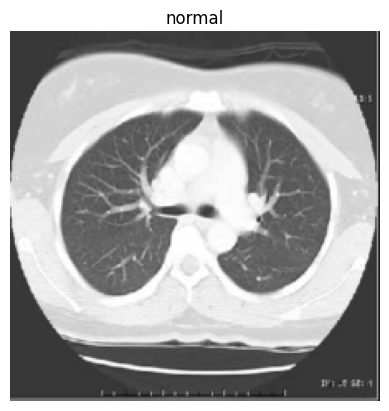

In [17]:
# Plot image with matplotlib
plt.imshow(image.permute(1, 2, 0)) # rearrange image dimensions to suit matplotlib [color_channels, height, width] -> [height, width, color_channels]
plt.title(class_names[label])
plt.axis(False);

#  Replicating the ViT paper: an overview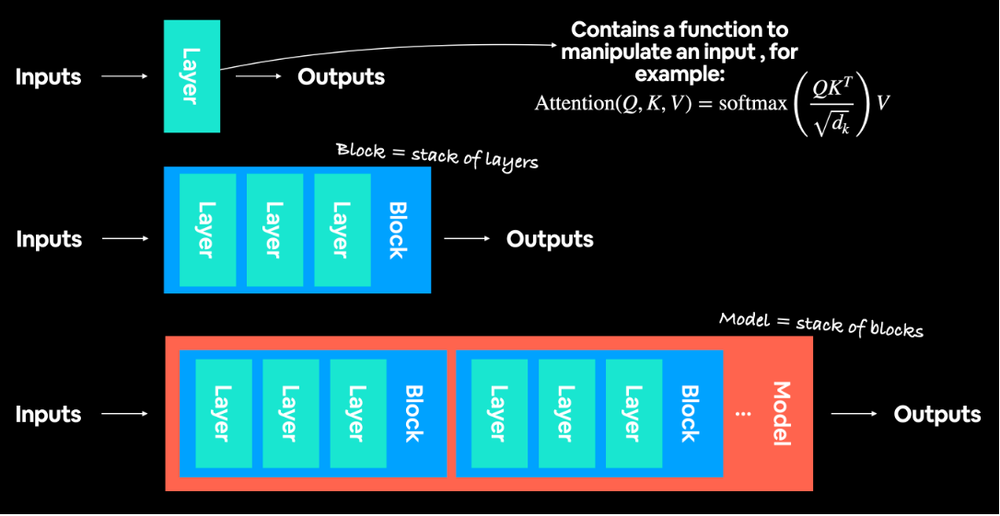

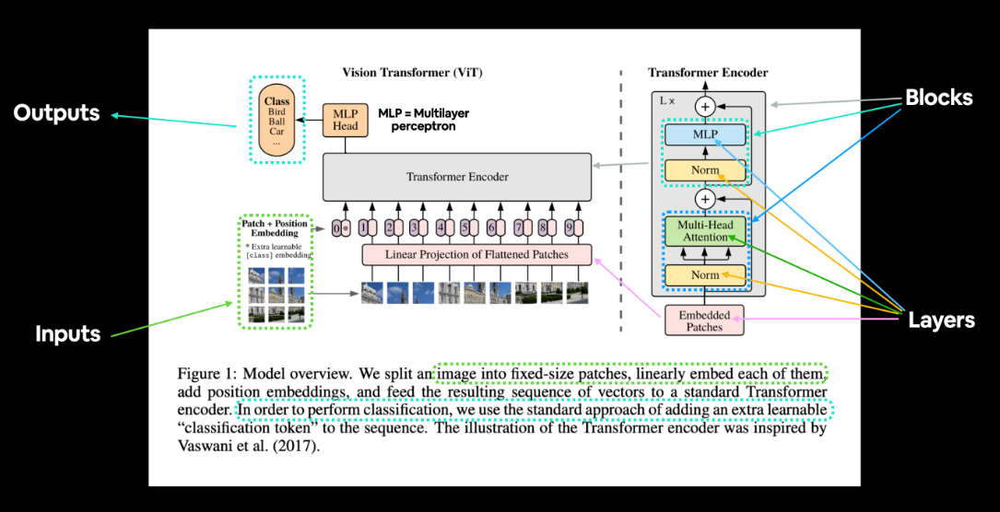

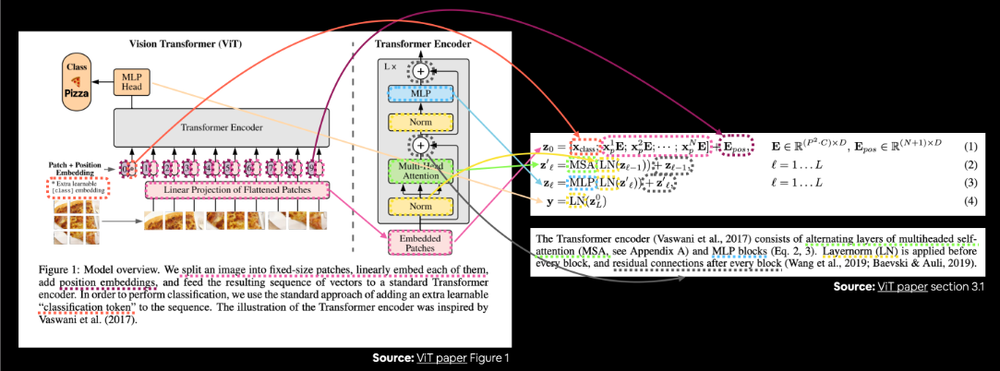

# For EQ1 of Vit

In [18]:
# Create example values
height = 224 # H ("The training resolution is 224.")
width = 224 # W
color_channels = 3 # C
patch_size = 16 # P

# Calculate N (number of patches)
number_of_patches = int((height * width) / patch_size**2)
print(f"Number of patches (N) with image height (H={height}), width (W={width}) and patch size (P={patch_size}): {number_of_patches}")

Number of patches (N) with image height (H=224), width (W=224) and patch size (P=16): 196


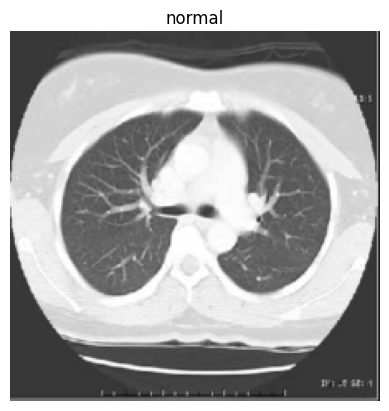

In [19]:
# View single image
plt.imshow(image.permute(1, 2, 0))
plt.title(class_names[label])
plt.axis(False);

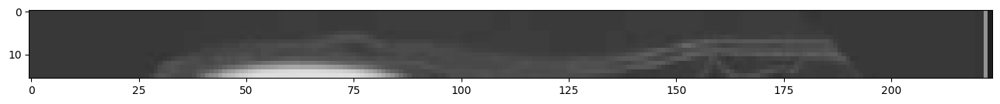

In [20]:
# Change image shape to be compatible with matplotlib (color_channels, height, width) -> (height, width, color_channels)
image_permuted = image.permute(1, 2, 0)

# Index to plot the top row of patched pixels
patch_size = 16
plt.figure(figsize=(patch_size, patch_size))
plt.imshow(image_permuted[:patch_size, :, :]);

Number of patches per row: 14.0
Patch size: 16 pixels x 16 pixels


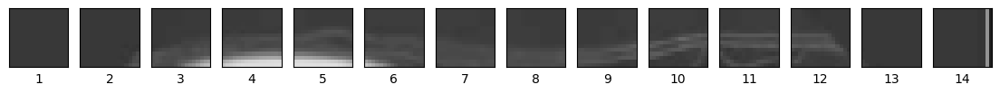

In [21]:
# Setup hyperparameters and make sure img_size and patch_size are compatible
img_size = 224
patch_size = 16
num_patches = img_size/patch_size
assert img_size % patch_size == 0, "Image size must be divisible by patch size"
print(f"Number of patches per row: {num_patches}\nPatch size: {patch_size} pixels x {patch_size} pixels")

# Create a series of subplots
fig, axs = plt.subplots(nrows=1,
                        ncols=img_size // patch_size, # one column for each patch
                        figsize=(num_patches, num_patches),
                        sharex=True,
                        sharey=True)

# Iterate through number of patches in the top row
for i, patch in enumerate(range(0, img_size, patch_size)):
    axs[i].imshow(image_permuted[:patch_size, patch:patch+patch_size, :]); # keep height index constant, alter the width index
    axs[i].set_xlabel(i+1) # set the label
    axs[i].set_xticks([])
    axs[i].set_yticks([])

Number of patches per row: 14.0        
Number of patches per column: 14.0        
Total patches: 196.0        
Patch size: 16 pixels x 16 pixels


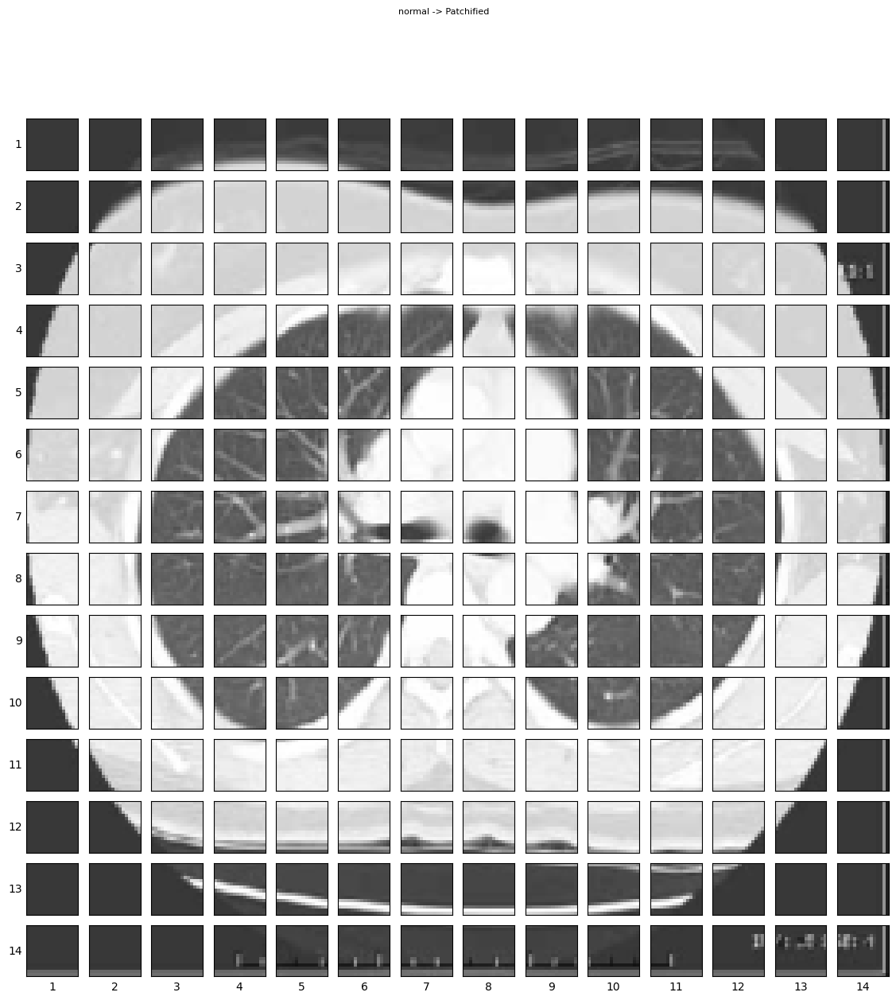

In [22]:
# Setup hyperparameters and make sure img_size and patch_size are compatible
img_size = 224
patch_size = 16
num_patches = img_size/patch_size
assert img_size % patch_size == 0, "Image size must be divisible by patch size"
print(f"Number of patches per row: {num_patches}\
        \nNumber of patches per column: {num_patches}\
        \nTotal patches: {num_patches*num_patches}\
        \nPatch size: {patch_size} pixels x {patch_size} pixels")

# Create a series of subplots
fig, axs = plt.subplots(nrows=img_size // patch_size, # need int not float
                        ncols=img_size // patch_size,
                        figsize=(num_patches, num_patches),
                        sharex=True,
                        sharey=True)

# Loop through height and width of image
for i, patch_height in enumerate(range(0, img_size, patch_size)): # iterate through height
    for j, patch_width in enumerate(range(0, img_size, patch_size)): # iterate through width

        # Plot the permuted image patch (image_permuted -> (Height, Width, Color Channels))
        axs[i, j].imshow(image_permuted[patch_height:patch_height+patch_size, # iterate through height
                                        patch_width:patch_width+patch_size, # iterate through width
                                        :]) # get all color channels

        # Set up label information, remove the ticks for clarity and set labels to outside
        axs[i, j].set_ylabel(i+1,
                             rotation="horizontal",
                             horizontalalignment="right",
                             verticalalignment="center")
        axs[i, j].set_xlabel(j+1)
        axs[i, j].set_xticks([])
        axs[i, j].set_yticks([])
        axs[i, j].label_outer()

# Set a super title
fig.suptitle(f"{class_names[label]} -> Patchified", fontsize=8)
plt.show()

In [23]:
from torch import nn

# Set the patch size
patch_size=16

# Create the Conv2d layer with hyperparameters from the ViT paper
conv2d = nn.Conv2d(in_channels=3, # number of color channels
                   out_channels=768, # from Table 1: Hidden size D, this is the embedding size
                   kernel_size=patch_size, # could also use (patch_size, patch_size)
                   stride=patch_size,
                   padding=0)

In [24]:
# Pass the image through the convolutional layer
image_out_of_conv = conv2d(image.unsqueeze(0)) # add a single batch dimension (height, width, color_channels) -> (batch, height, width, color_channels)
print(image_out_of_conv.shape)

torch.Size([1, 768, 14, 14])


Showing random convolutional feature maps from indexes: [114, 25, 281, 250, 228]


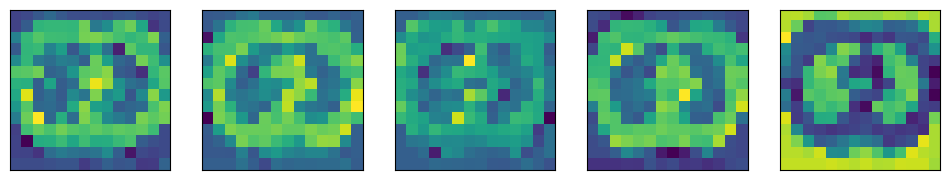

In [25]:
# Plot random 5 convolutional feature maps
import random
random_indexes = random.sample(range(0, 758), k=5) # pick 5 numbers between 0 and the embedding size
print(f"Showing random convolutional feature maps from indexes: {random_indexes}")

# Create plot
fig, axs = plt.subplots(nrows=1, ncols=5, figsize=(12, 12))

# Plot random image feature maps
for i, idx in enumerate(random_indexes):
    image_conv_feature_map = image_out_of_conv[:, idx, :, :] # index on the output tensor of the convolutional layer
    axs[i].imshow(image_conv_feature_map.squeeze().detach().numpy())
    axs[i].set(xticklabels=[], yticklabels=[], xticks=[], yticks=[]);

In [26]:
# Create flatten layer
flatten = nn.Flatten(start_dim=2, # flatten feature_map_height (dimension 2)
                     end_dim=3) # flatten feature_map_width (dimension 3

Original image shape: torch.Size([3, 224, 224])
Image feature map shape: torch.Size([1, 768, 14, 14])
Flattened image feature map shape: torch.Size([1, 768, 196])


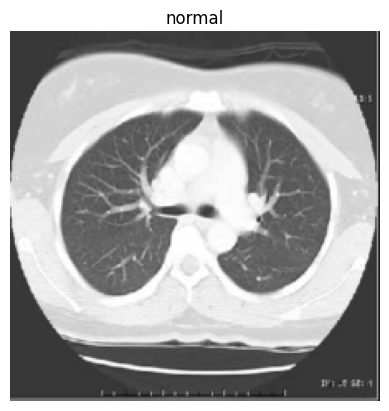

In [27]:
# 1. View single image
plt.imshow(image.permute(1, 2, 0)) # adjust for matplotlib
plt.title(class_names[label])
plt.axis(False);
print(f"Original image shape: {image.shape}")

# 2. Turn image into feature maps
image_out_of_conv = conv2d(image.unsqueeze(0)) # add batch dimension to avoid shape errors
print(f"Image feature map shape: {image_out_of_conv.shape}")

# 3. Flatten the feature maps
image_out_of_conv_flattened = flatten(image_out_of_conv)
print(f"Flattened image feature map shape: {image_out_of_conv_flattened.shape}")

In [28]:
# Get flattened image patch embeddings in right shape
image_out_of_conv_flattened_reshaped = image_out_of_conv_flattened.permute(0, 2, 1) # [batch_size, P^2•C, N] -> [batch_size, N, P^2•C]
print(f"Patch embedding sequence shape: {image_out_of_conv_flattened_reshaped.shape} -> [batch_size, num_patches, embedding_size]")

Patch embedding sequence shape: torch.Size([1, 196, 768]) -> [batch_size, num_patches, embedding_size]


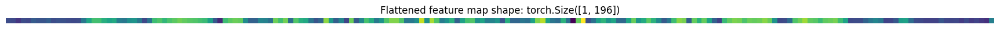

In [29]:
# Get a single flattened feature map
single_flattened_feature_map = image_out_of_conv_flattened_reshaped[:, :, 0] # index: (batch_size, number_of_patches, embedding_dimension)

# Plot the flattened feature map visually
plt.figure(figsize=(22, 22))
plt.imshow(single_flattened_feature_map.detach().numpy())
plt.title(f"Flattened feature map shape: {single_flattened_feature_map.shape}")
plt.axis(False);

In [30]:
# 1. Create a class which subclasses nn.Module
class PatchEmbedding(nn.Module):
    """Turns a 2D input image into a 1D sequence learnable embedding vector.

    Args:
        in_channels (int): Number of color channels for the input images. Defaults to 3.
        patch_size (int): Size of patches to convert input image into. Defaults to 16.
        embedding_dim (int): Size of embedding to turn image into. Defaults to 768.
    """
    # 2. Initialize the class with appropriate variables
    def __init__(self,
                 in_channels:int=3,
                 patch_size:int=16,
                 embedding_dim:int=768):
        super().__init__()

        # 3. Create a layer to turn an image into patches
        self.patcher = nn.Conv2d(in_channels=in_channels,
                                 out_channels=embedding_dim,
                                 kernel_size=patch_size,
                                 stride=patch_size,
                                 padding=0)

        # 4. Create a layer to flatten the patch feature maps into a single dimension
        self.flatten = nn.Flatten(start_dim=2, # only flatten the feature map dimensions into a single vector
                                  end_dim=3)

    # 5. Define the forward method
    def forward(self, x):
        # Create assertion to check that inputs are the correct shape
        image_resolution = x.shape[-1]
        assert image_resolution % patch_size == 0, f"Input image size must be divisible by patch size, image shape: {image_resolution}, patch size: {patch_size}"

        # Perform the forward pass
        x_patched = self.patcher(x)
        x_flattened = self.flatten(x_patched)
        # 6. Make sure the output shape has the right order
        return x_flattened.permute(0, 2, 1) # adjust so the embedding is on the final dimension [batch_size, P^2•C, N] -> [batch_size, N, P^2•C]

In [31]:
import random

random.seed() # Use seed() to initialize the random number generator

# Create an instance of patch embedding layer
patchify = PatchEmbedding(in_channels=3,
                          patch_size=16,
                          embedding_dim=768)

# Pass a single image through
print(f"Input image shape: {image.unsqueeze(0).shape}")
patch_embedded_image = patchify(image.unsqueeze(0)) # add an extra batch dimension on the 0th index, otherwise will error
print(f"Output patch embedding shape: {patch_embedded_image.shape}")

Input image shape: torch.Size([1, 3, 224, 224])
Output patch embedding shape: torch.Size([1, 196, 768])


In [32]:
# Create random input sizes
random_input_image = (1, 3, 224, 224)
random_input_image_error = (1, 3, 250, 250) # will error because image size is incompatible with patch_size

 # Get a summary of the input and outputs of PatchEmbedding (uncomment for full output)
summary(PatchEmbedding(),
         input_size=random_input_image, # try swapping this for "random_input_image_error"
         col_names=["input_size", "output_size", "num_params", "trainable"],
         col_width=20,
         row_settings=["var_names"])

Layer (type (var_name))                  Input Shape          Output Shape         Param #              Trainable
PatchEmbedding (PatchEmbedding)          [1, 3, 224, 224]     [1, 196, 768]        --                   True
├─Conv2d (patcher)                       [1, 3, 224, 224]     [1, 768, 14, 14]     590,592              True
├─Flatten (flatten)                      [1, 768, 14, 14]     [1, 768, 196]        --                   --
Total params: 590,592
Trainable params: 590,592
Non-trainable params: 0
Total mult-adds (M): 115.76
Input size (MB): 0.60
Forward/backward pass size (MB): 1.20
Params size (MB): 2.36
Estimated Total Size (MB): 4.17

In [33]:
# View the patch embedding and patch embedding shape
print(patch_embedded_image)
print(f"Patch embedding shape: {patch_embedded_image.shape} -> [batch_size, number_of_patches, embedding_dimension]")

tensor([[[ 0.1095, -0.0362,  0.0069,  ..., -0.0552,  0.1552, -0.0988],
         [ 0.1133, -0.0308,  0.0094,  ..., -0.0461,  0.1596, -0.1074],
         [ 0.1220, -0.0479,  0.0183,  ...,  0.0108,  0.2005, -0.1511],
         ...,
         [ 0.0875, -0.0716, -0.0188,  ..., -0.0586,  0.1967, -0.1250],
         [ 0.0885, -0.0629,  0.0268,  ..., -0.1182,  0.2085, -0.1146],
         [ 0.1038, -0.0297, -0.0163,  ..., -0.1238,  0.2685, -0.0336]]],
       grad_fn=<PermuteBackward0>)
Patch embedding shape: torch.Size([1, 196, 768]) -> [batch_size, number_of_patches, embedding_dimension]


In [34]:
# Get the batch size and embedding dimension
batch_size = patch_embedded_image.shape[0]
embedding_dimension = patch_embedded_image.shape[-1]

# Create the class token embedding as a learnable parameter that shares the same size as the embedding dimension (D)
class_token = nn.Parameter(torch.ones(batch_size, 1, embedding_dimension), # [batch_size, number_of_tokens, embedding_dimension]
                           requires_grad=True) # make sure the embedding is learnable

# Show the first 10 examples of the class_token
print(class_token[:, :, :10])

# Print the class_token shape
print(f"Class token shape: {class_token.shape} -> [batch_size, number_of_tokens, embedding_dimension]")

tensor([[[1., 1., 1., 1., 1., 1., 1., 1., 1., 1.]]], grad_fn=<SliceBackward0>)
Class token shape: torch.Size([1, 1, 768]) -> [batch_size, number_of_tokens, embedding_dimension]


In [35]:
# Add the class token embedding to the front of the patch embedding
patch_embedded_image_with_class_embedding = torch.cat((class_token, patch_embedded_image),
                                                      dim=1) # concat on first dimension

# Print the sequence of patch embeddings with the prepended class token embedding
print(patch_embedded_image_with_class_embedding)
print(f"Sequence of patch embeddings with class token prepended shape: {patch_embedded_image_with_class_embedding.shape} -> [batch_size, number_of_patches, embedding_dimension]")

tensor([[[ 1.0000,  1.0000,  1.0000,  ...,  1.0000,  1.0000,  1.0000],
         [ 0.1095, -0.0362,  0.0069,  ..., -0.0552,  0.1552, -0.0988],
         [ 0.1133, -0.0308,  0.0094,  ..., -0.0461,  0.1596, -0.1074],
         ...,
         [ 0.0875, -0.0716, -0.0188,  ..., -0.0586,  0.1967, -0.1250],
         [ 0.0885, -0.0629,  0.0268,  ..., -0.1182,  0.2085, -0.1146],
         [ 0.1038, -0.0297, -0.0163,  ..., -0.1238,  0.2685, -0.0336]]],
       grad_fn=<CatBackward0>)
Sequence of patch embeddings with class token prepended shape: torch.Size([1, 197, 768]) -> [batch_size, number_of_patches, embedding_dimension]


In [36]:
# Calculate N (number of patches)
number_of_patches = int((height * width) / patch_size**2)

# Get embedding dimension
embedding_dimension = patch_embedded_image_with_class_embedding.shape[2]

# Create the learnable 1D position embedding
position_embedding = nn.Parameter(torch.ones(1,
                                             number_of_patches+1,
                                             embedding_dimension),
                                  requires_grad=True) # make sure it's learnable

# Show the first 10 sequences and 10 position embedding values and check the shape of the position embedding
print(position_embedding[:, :10, :10])
print(f"Position embedding shape: {position_embedding.shape} -> [batch_size, number_of_patches, embedding_dimension]")

tensor([[[1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
         [1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
         [1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
         [1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
         [1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
         [1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
         [1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
         [1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
         [1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
         [1., 1., 1., 1., 1., 1., 1., 1., 1., 1.]]], grad_fn=<SliceBackward0>)
Position embedding shape: torch.Size([1, 197, 768]) -> [batch_size, number_of_patches, embedding_dimension]


In [37]:
# Add the position embedding to the patch and class token embedding
patch_and_position_embedding = patch_embedded_image_with_class_embedding + position_embedding
print(patch_and_position_embedding)
print(f"Patch embeddings, class token prepended and positional embeddings added shape: {patch_and_position_embedding.shape} -> [batch_size, number_of_patches, embedding_dimension]")

tensor([[[2.0000, 2.0000, 2.0000,  ..., 2.0000, 2.0000, 2.0000],
         [1.1095, 0.9638, 1.0069,  ..., 0.9448, 1.1552, 0.9012],
         [1.1133, 0.9692, 1.0094,  ..., 0.9539, 1.1596, 0.8926],
         ...,
         [1.0875, 0.9284, 0.9812,  ..., 0.9414, 1.1967, 0.8750],
         [1.0885, 0.9371, 1.0268,  ..., 0.8818, 1.2085, 0.8854],
         [1.1038, 0.9703, 0.9837,  ..., 0.8762, 1.2685, 0.9664]]],
       grad_fn=<AddBackward0>)
Patch embeddings, class token prepended and positional embeddings added shape: torch.Size([1, 197, 768]) -> [batch_size, number_of_patches, embedding_dimension]


#  Putting it all together: from image to embedding

In [38]:
random.seed()

# 1. Set patch size
patch_size = 16

# 2. Print shape of original image tensor and get the image dimensions
print(f"Image tensor shape: {image.shape}")
height, width = image.shape[1], image.shape[2]

# 3. Get image tensor and add batch dimension
x = image.unsqueeze(0)
print(f"Input image with batch dimension shape: {x.shape}")

# 4. Create patch embedding layer
patch_embedding_layer = PatchEmbedding(in_channels=3,
                                       patch_size=patch_size,
                                       embedding_dim=768)

# 5. Pass image through patch embedding layer
patch_embedding = patch_embedding_layer(x)
print(f"Patching embedding shape: {patch_embedding.shape}")

# 6. Create class token embedding
batch_size = patch_embedding.shape[0]
embedding_dimension = patch_embedding.shape[-1]
class_token = nn.Parameter(torch.ones(batch_size, 1, embedding_dimension),
                           requires_grad=True) # make sure it's learnable
print(f"Class token embedding shape: {class_token.shape}")

# 7. Prepend class token embedding to patch embedding
patch_embedding_class_token = torch.cat((class_token, patch_embedding), dim=1)
print(f"Patch embedding with class token shape: {patch_embedding_class_token.shape}")

# 8. Create position embedding
number_of_patches = int((height * width) / patch_size**2)
position_embedding = nn.Parameter(torch.ones(1, number_of_patches+1, embedding_dimension),
                                  requires_grad=True) # make sure it's learnable

# 9. Add position embedding to patch embedding with class token
patch_and_position_embedding = patch_embedding_class_token + position_embedding
print(f"Patch and position embedding shape: {patch_and_position_embedding.shape}")

Image tensor shape: torch.Size([3, 224, 224])
Input image with batch dimension shape: torch.Size([1, 3, 224, 224])
Patching embedding shape: torch.Size([1, 196, 768])
Class token embedding shape: torch.Size([1, 1, 768])
Patch embedding with class token shape: torch.Size([1, 197, 768])
Patch and position embedding shape: torch.Size([1, 197, 768])


# Equation 2: Multi-Head Attention (MSA)

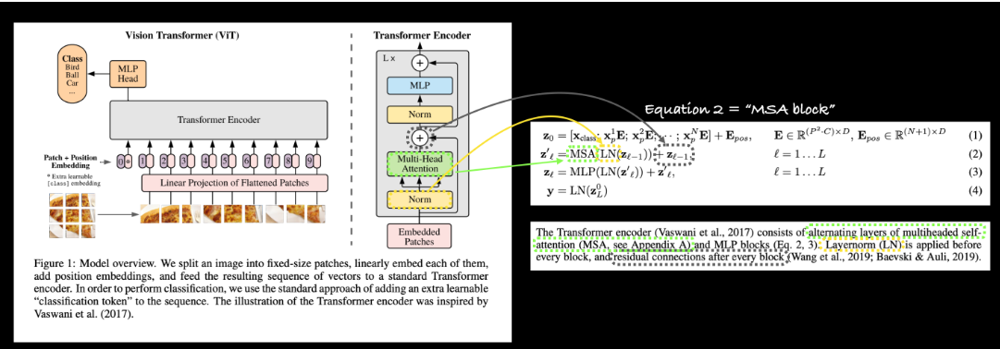

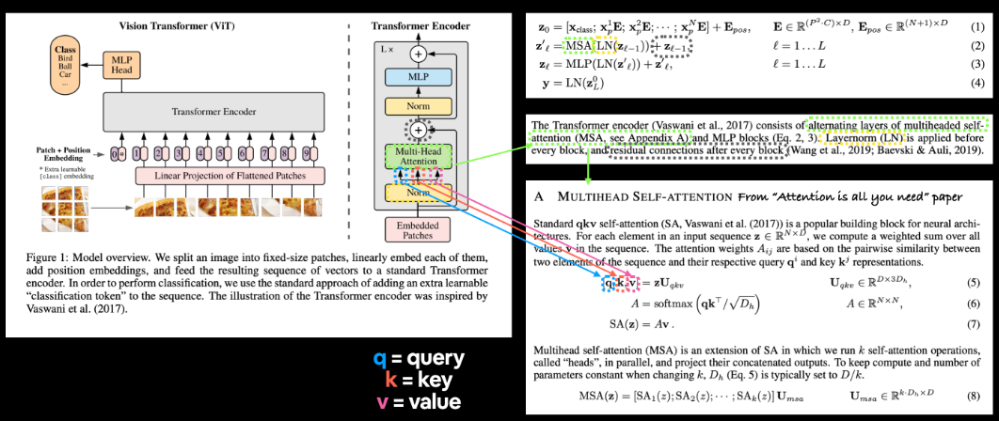

In [39]:
# 1. Create a class that inherits from nn.Module
class MultiheadSelfAttentionBlock(nn.Module):
    """Creates a multi-head self-attention block ("MSA block" for short).
    """
    # 2. Initialize the class with hyperparameters from Table 1
    def __init__(self,
                 embedding_dim:int=768, # Hidden size D from Table 1 for ViT-Base
                 num_heads:int=12, # Heads from Table 1 for ViT-Base
                 attn_dropout:float=0): # doesn't look like the paper uses any dropout in MSABlocks
        super().__init__()

        # 3. Create the Norm layer (LN)
        self.layer_norm = nn.LayerNorm(normalized_shape=embedding_dim)

        # 4. Create the Multi-Head Attention (MSA) layer
        self.multihead_attn = nn.MultiheadAttention(embed_dim=embedding_dim,
                                                    num_heads=num_heads,
                                                    dropout=attn_dropout,
                                                    batch_first=True) # does our batch dimension come first?

    # 5. Create a forward() method to pass the data through the layers
    def forward(self, x):
        x = self.layer_norm(x)
        attn_output, _ = self.multihead_attn(query=x, # query embeddings
                                             key=x, # key embeddings
                                             value=x, # value embeddings
                                             need_weights=False) # do we need the weights or just the layer outputs?
        return attn_output

In [40]:
# Create an instance of MSABlock
multihead_self_attention_block = MultiheadSelfAttentionBlock(embedding_dim=768, # from Table 1
                                                             num_heads=12) # from Table 1

# Pass patch and position image embedding through MSABlock
patched_image_through_msa_block = multihead_self_attention_block(patch_and_position_embedding)
print(f"Input shape of MSA block: {patch_and_position_embedding.shape}")
print(f"Output shape MSA block: {patched_image_through_msa_block.shape}")

Input shape of MSA block: torch.Size([1, 197, 768])
Output shape MSA block: torch.Size([1, 197, 768])


# Equation 3: Multilayer Perceptron (MLP)


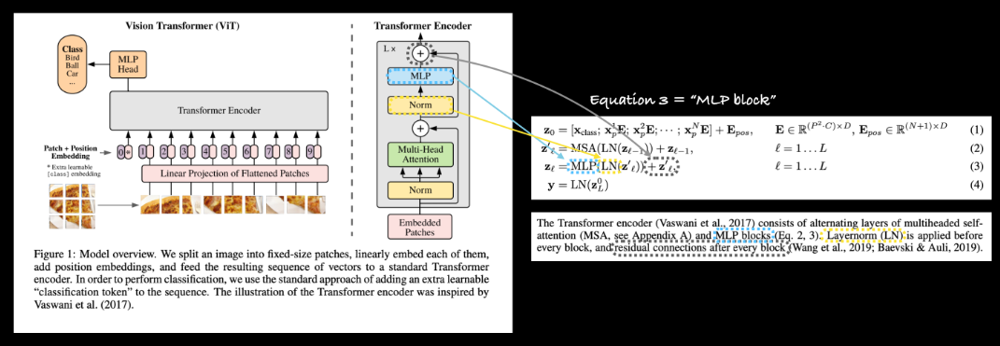

In [41]:
# 1. Create a class that inherits from nn.Module
class MLPBlock(nn.Module):
    """Creates a layer normalized multilayer perceptron block ("MLP block" for short)."""
    # 2. Initialize the class with hyperparameters from Table 1 and Table 3
    def __init__(self,
                 embedding_dim:int=768, # Hidden Size D from Table 1 for ViT-Base
                 mlp_size:int=3072, # MLP size from Table 1 for ViT-Base
                 dropout:float=0.1): # Dropout from Table 3 for ViT-Base
        super().__init__()

        # 3. Create the Norm layer (LN)
        self.layer_norm = nn.LayerNorm(normalized_shape=embedding_dim)

        # 4. Create the Multilayer perceptron (MLP) layer(s)
        self.mlp = nn.Sequential(
            nn.Linear(in_features=embedding_dim,
                      out_features=mlp_size),
            nn.GELU(), # "The MLP contains two layers with a GELU non-linearity (section 3.1)."
            nn.Dropout(p=dropout),
            nn.Linear(in_features=mlp_size, # needs to take same in_features as out_features of layer above
                      out_features=embedding_dim), # take back to embedding_dim
            nn.Dropout(p=dropout) # "Dropout, when used, is applied after every dense layer.."
        )

    # 5. Create a forward() method to pass the data through the layers
    def forward(self, x):
        x = self.layer_norm(x)
        x = self.mlp(x)
        return x

In [42]:
# Create an instance of MLPBlock
mlp_block = MLPBlock(embedding_dim=768, # from Table 1
                     mlp_size=3072, # from Table 1
                     dropout=0.1) # from Table 3

# Pass output of MSABlock through MLPBlock
patched_image_through_mlp_block = mlp_block(patched_image_through_msa_block)
print(f"Input shape of MLP block: {patched_image_through_msa_block.shape}")
print(f"Output shape MLP block: {patched_image_through_mlp_block.shape}")

Input shape of MLP block: torch.Size([1, 197, 768])
Output shape MLP block: torch.Size([1, 197, 768])


#  Creating a Transformer Encoder by combining our custom made layers

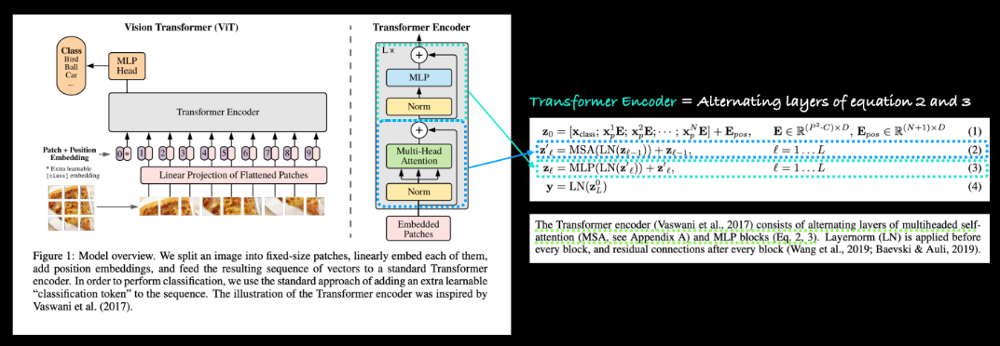

In [43]:
# 1. Create a class that inherits from nn.Module
class TransformerEncoderBlock(nn.Module):
    """Creates a Transformer Encoder block."""
    # 2. Initialize the class with hyperparameters from Table 1 and Table 3
    def __init__(self,
                 embedding_dim:int=768, # Hidden size D from Table 1 for ViT-Base
                 num_heads:int=12, # Heads from Table 1 for ViT-Base
                 mlp_size:int=3072, # MLP size from Table 1 for ViT-Base
                 mlp_dropout:float=0.1, # Amount of dropout for dense layers from Table 3 for ViT-Base
                 attn_dropout:float=0): # Amount of dropout for attention layers
        super().__init__()

        # 3. Create MSA block (equation 2)
        self.msa_block = MultiheadSelfAttentionBlock(embedding_dim=embedding_dim,
                                                     num_heads=num_heads,
                                                     attn_dropout=attn_dropout)

        # 4. Create MLP block (equation 3)
        self.mlp_block =  MLPBlock(embedding_dim=embedding_dim,
                                   mlp_size=mlp_size,
                                   dropout=mlp_dropout)

    # 5. Create a forward() method
    def forward(self, x):

        # 6. Create residual connection for MSA block (add the input to the output)
        x =  self.msa_block(x) + x

        # 7. Create residual connection for MLP block (add the input to the output)
        x = self.mlp_block(x) + x

        return x

In [44]:
# Create an instance of TransformerEncoderBlock
transformer_encoder_block = TransformerEncoderBlock()

# Print an input and output summary of our Transformer Encoder (uncomment for full output)
summary(model=transformer_encoder_block,
        input_size=(1, 197, 768), # (batch_size, num_patches, embedding_dimension)
                 col_names=["input_size", "output_size", "num_params", "trainable"],
         col_width=20,
         row_settings=["var_names"])

Layer (type (var_name))                            Input Shape          Output Shape         Param #              Trainable
TransformerEncoderBlock (TransformerEncoderBlock)  [1, 197, 768]        [1, 197, 768]        --                   True
├─MultiheadSelfAttentionBlock (msa_block)          [1, 197, 768]        [1, 197, 768]        --                   True
│    └─LayerNorm (layer_norm)                      [1, 197, 768]        [1, 197, 768]        1,536                True
│    └─MultiheadAttention (multihead_attn)         --                   [1, 197, 768]        2,362,368            True
├─MLPBlock (mlp_block)                             [1, 197, 768]        [1, 197, 768]        --                   True
│    └─LayerNorm (layer_norm)                      [1, 197, 768]        [1, 197, 768]        1,536                True
│    └─Sequential (mlp)                            [1, 197, 768]        [1, 197, 768]        --                   True
│    │    └─Linear (0)                     

#  Putting it all together to create ViT

In [45]:
# 1. Create a ViT class that inherits from nn.Module
class ViT(nn.Module):
    """Creates a Vision Transformer architecture with ViT-Base hyperparameters by default."""
    # 2. Initialize the class with hyperparameters from Table 1 and Table 3
    def __init__(self,
                 img_size:int=224, # Training resolution from Table 3 in ViT paper
                 in_channels:int=3, # Number of channels in input image
                 patch_size:int=16, # Patch size
                 num_transformer_layers:int=12, # Layers from Table 1 for ViT-Base
                 embedding_dim:int=768, # Hidden size D from Table 1 for ViT-Base
                 mlp_size:int=3072, # MLP size from Table 1 for ViT-Base
                 num_heads:int=12, # Heads from Table 1 for ViT-Base
                 attn_dropout:float=0, # Dropout for attention projection
                 mlp_dropout:float=0.1, # Dropout for dense/MLP layers
                 embedding_dropout:float=0.1, # Dropout for patch and position embeddings
                 num_classes:int=1000): # Default for ImageNet but can customize this
        super().__init__() # don't forget the super().__init__()!

        # 3. Make the image size is divisible by the patch size
        assert img_size % patch_size == 0, f"Image size must be divisible by patch size, image size: {img_size}, patch size: {patch_size}."

        # 4. Calculate number of patches (height * width/patch^2)
        self.num_patches = (img_size * img_size) // patch_size**2

        # 5. Create learnable class embedding (needs to go at front of sequence of patch embeddings)
        self.class_embedding = nn.Parameter(data=torch.randn(1, 1, embedding_dim),
                                            requires_grad=True)

        # 6. Create learnable position embedding
        self.position_embedding = nn.Parameter(data=torch.randn(1, self.num_patches+1, embedding_dim),
                                               requires_grad=True)

        # 7. Create embedding dropout value
        self.embedding_dropout = nn.Dropout(p=embedding_dropout)

        # 8. Create patch embedding layer
        self.patch_embedding = PatchEmbedding(in_channels=in_channels,
                                              patch_size=patch_size,
                                              embedding_dim=embedding_dim)

        # 9. Create Transformer Encoder blocks (we can stack Transformer Encoder blocks using nn.Sequential())
        # Note: The "*" means "all"
        self.transformer_encoder = nn.Sequential(*[TransformerEncoderBlock(embedding_dim=embedding_dim,
                                                                            num_heads=num_heads,
                                                                            mlp_size=mlp_size,
                                                                            mlp_dropout=mlp_dropout) for _ in range(num_transformer_layers)])

        # 10. Create classifier head
        self.classifier = nn.Sequential(
            nn.LayerNorm(normalized_shape=embedding_dim),
            nn.Linear(in_features=embedding_dim,
                      out_features=num_classes)
        )

    # 11. Create a forward() method
    def forward(self, x):

        # 12. Get batch size
        batch_size = x.shape[0]

        # 13. Create class token embedding and expand it to match the batch size (equation 1)
        class_token = self.class_embedding.expand(batch_size, -1, -1) # "-1" means to infer the dimension (try this line on its own)

        # 14. Create patch embedding (equation 1)
        x = self.patch_embedding(x)

        # 15. Concat class embedding and patch embedding (equation 1)
        x = torch.cat((class_token, x), dim=1)

        # 16. Add position embedding to patch embedding (equation 1)
        x = self.position_embedding + x

        # 17. Run embedding dropout (Appendix B.1)
        x = self.embedding_dropout(x)

        # 18. Pass patch, position and class embedding through transformer encoder layers (equations 2 & 3)
        x = self.transformer_encoder(x)

        # 19. Put 0 index logit through classifier (equation 4)
        x = self.classifier(x[:, 0]) # run on each sample in a batch at 0 index

        return x

In [46]:
# Example of creating the class embedding and expanding over a batch dimension
batch_size = 32
class_token_embedding_single = nn.Parameter(data=torch.randn(1, 1, 768)) # create a single learnable class token
class_token_embedding_expanded = class_token_embedding_single.expand(batch_size, -1, -1) # expand the single learnable class token across the batch dimension, "-1" means to "infer the dimension"

# Print out the change in shapes
print(f"Shape of class token embedding single: {class_token_embedding_single.shape}")
print(f"Shape of class token embedding expanded: {class_token_embedding_expanded.shape}")

Shape of class token embedding single: torch.Size([1, 1, 768])
Shape of class token embedding expanded: torch.Size([32, 1, 768])


In [47]:
random.seed()

# Create a random tensor with same shape as a single image
random_image_tensor = torch.randn(1, 3, 224, 224) # (batch_size, color_channels, height, width)
# Create an instance of ViT with the number of classes we're working with
vit = ViT(num_classes=len(class_names))

# Pass the random image tensor to our ViT instance
vit(random_image_tensor)

tensor([[ 0.8012, -0.1453,  0.2536, -0.5357]], grad_fn=<AddmmBackward0>)

In [48]:


# Print a summary of our custom ViT model using torchinfo (uncomment for actual output)
summary(model=vit,
      input_size=(32, 3, 224, 224), # (batch_size, color_channels, height, width)
        # col_names=["input_size"], # uncomment for smaller output
         col_names=["input_size", "output_size", "num_params", "trainable"],
        col_width=20,
        row_settings=["var_names"]
 )

Layer (type (var_name))                                      Input Shape          Output Shape         Param #              Trainable
ViT (ViT)                                                    [32, 3, 224, 224]    [32, 4]              152,064              True
├─PatchEmbedding (patch_embedding)                           [32, 3, 224, 224]    [32, 196, 768]       --                   True
│    └─Conv2d (patcher)                                      [32, 3, 224, 224]    [32, 768, 14, 14]    590,592              True
│    └─Flatten (flatten)                                     [32, 768, 14, 14]    [32, 768, 196]       --                   --
├─Dropout (embedding_dropout)                                [32, 197, 768]       [32, 197, 768]       --                   --
├─Sequential (transformer_encoder)                           [32, 197, 768]       [32, 197, 768]       --                   True
│    └─TransformerEncoderBlock (0)                           [32, 197, 768]       [32, 197, 768]

# Training our ViT model

In [49]:
import torch

from tqdm.auto import tqdm
from typing import Dict, List, Tuple

def train_step(model: torch.nn.Module,
               dataloader: torch.utils.data.DataLoader,
               loss_fn: torch.nn.Module,
               optimizer: torch.optim.Optimizer,
               device: torch.device) -> Tuple[float, float]:
  """Trains a PyTorch model for a single epoch.

  Turns a target PyTorch model to training mode and then
  runs through all of the required training steps (forward
  pass, loss calculation, optimizer step).

  Args:
    model: A PyTorch model to be trained.
    dataloader: A DataLoader instance for the model to be trained on.
    loss_fn: A PyTorch loss function to minimize.
    optimizer: A PyTorch optimizer to help minimize the loss function.
    device: A target device to compute on (e.g. "cuda" or "cpu").

  Returns:
    A tuple of training loss and training accuracy metrics.
    In the form (train_loss, train_accuracy). For example:

    (0.1112, 0.8743)
  """
  # Put model in train mode
  model.train()

  # Setup train loss and train accuracy values
  train_loss, train_acc = 0, 0

  # Loop through data loader data batches
  for batch, (X, y) in enumerate(dataloader):
      # Send data to target device
      X, y = X.to(device), y.to(device)

      # 1. Forward pass
      y_pred = model(X)

      # 2. Calculate  and accumulate loss
      loss = loss_fn(y_pred, y)
      train_loss += loss.item()

      # 3. Optimizer zero grad
      optimizer.zero_grad()

      # 4. Loss backward
      loss.backward()

      # 5. Optimizer step
      optimizer.step()

      # Calculate and accumulate accuracy metric across all batches
      y_pred_class = torch.argmax(torch.softmax(y_pred, dim=1), dim=1)
      train_acc += (y_pred_class == y).sum().item()/len(y_pred)

  # Adjust metrics to get average loss and accuracy per batch
  train_loss = train_loss / len(dataloader)
  train_acc = train_acc / len(dataloader)
  return train_loss, train_acc

def test_step(model: torch.nn.Module,
              dataloader: torch.utils.data.DataLoader,
              loss_fn: torch.nn.Module,
              device: torch.device) -> Tuple[float, float]:
  """Tests a PyTorch model for a single epoch.

  Turns a target PyTorch model to "eval" mode and then performs
  a forward pass on a testing dataset.

  Args:
    model: A PyTorch model to be tested.
    dataloader: A DataLoader instance for the model to be tested on.
    loss_fn: A PyTorch loss function to calculate loss on the test data.
    device: A target device to compute on (e.g. "cuda" or "cpu").

  Returns:
    A tuple of testing loss and testing accuracy metrics.
    In the form (test_loss, test_accuracy). For example:

    (0.0223, 0.8985)
  """
  # Put model in eval mode
  model.eval()

  # Setup test loss and test accuracy values
  test_loss, test_acc = 0, 0

  # Turn on inference context manager
  with torch.inference_mode():
      # Loop through DataLoader batches
      for batch, (X, y) in enumerate(dataloader):
          # Send data to target device
          X, y = X.to(device), y.to(device)

          # 1. Forward pass
          test_pred_logits = model(X)

          # 2. Calculate and accumulate loss
          loss = loss_fn(test_pred_logits, y)
          test_loss += loss.item()

          # Calculate and accumulate accuracy
          test_pred_labels = test_pred_logits.argmax(dim=1)
          test_acc += ((test_pred_labels == y).sum().item()/len(test_pred_labels))

  # Adjust metrics to get average loss and accuracy per batch
  test_loss = test_loss / len(dataloader)
  test_acc = test_acc / len(dataloader)
  return test_loss, test_acc

def train(model: torch.nn.Module,
          train_dataloader: torch.utils.data.DataLoader,
          test_dataloader: torch.utils.data.DataLoader,
          optimizer: torch.optim.Optimizer,
          loss_fn: torch.nn.Module,
          epochs: int,
          device: torch.device) -> Dict[str, List]:
  """Trains and tests a PyTorch model.

  Passes a target PyTorch models through train_step() and test_step()
  functions for a number of epochs, training and testing the model
  in the same epoch loop.

  Calculates, prints and stores evaluation metrics throughout.

  Args:
    model: A PyTorch model to be trained and tested.
    train_dataloader: A DataLoader instance for the model to be trained on.
    test_dataloader: A DataLoader instance for the model to be tested on.
    optimizer: A PyTorch optimizer to help minimize the loss function.
    loss_fn: A PyTorch loss function to calculate loss on both datasets.
    epochs: An integer indicating how many epochs to train for.
    device: A target device to compute on (e.g. "cuda" or "cpu").

  Returns:
    A dictionary of training and testing loss as well as training and
    testing accuracy metrics. Each metric has a value in a list for
    each epoch.
    In the form: {train_loss: [...],
                  train_acc: [...],
                  test_loss: [...],
                  test_acc: [...]}
    For example if training for epochs=2:
                 {train_loss: [2.0616, 1.0537],
                  train_acc: [0.3945, 0.3945],
                  test_loss: [1.2641, 1.5706],
                  test_acc: [0.3400, 0.2973]}
  """
  # Create empty results dictionary
  results = {"train_loss": [],
      "train_acc": [],
      "test_loss": [],
      "test_acc": []
  }

  # Loop through training and testing steps for a number of epochs
  for epoch in tqdm(range(epochs)):
      train_loss, train_acc = train_step(model=model,
                                          dataloader=train_dataloader,
                                          loss_fn=loss_fn,
                                          optimizer=optimizer,
                                          device=device)
      test_loss, test_acc = test_step(model=model,
          dataloader=test_dataloader,
          loss_fn=loss_fn,
          device=device)

      # Print out what's happening
      print(
          f"Epoch: {epoch+1} | "
          f"train_loss: {train_loss:.4f} | "
          f"train_acc: {train_acc:.4f} | "
          f"test_loss: {test_loss:.4f} | "
          f"test_acc: {test_acc:.4f}"
      )

      # Update results dictionary
      results["train_loss"].append(train_loss)
      results["train_acc"].append(train_acc)
      results["test_loss"].append(test_loss)
      results["test_acc"].append(test_acc)

  # Return the filled results at the end of the epochs
  return results


In [50]:
device = "cuda" if torch.cuda.is_available() else "cpu"
device

'cuda'

In [92]:
# Setup the optimizer to optimize our ViT model parameters using hyperparameters from the ViT paper
optimizer = torch.optim.Adam(params=vit.parameters(),
                             lr=3e-3, # Base LR from Table 3 for ViT-* ImageNet-1k
                             betas=(0.9, 0.999), # default values but also mentioned in ViT paper section 4.1 (Training & Fine-tuning)
                             weight_decay=0.3) # from the ViT paper section 4.1 (Training & Fine-tuning) and Table 3 for ViT-* ImageNet-1k

# Setup the loss function for multi-class classification
loss_fn = torch.nn.CrossEntropyLoss()

# Set the seeds
random.seed()

# Train the model and save the training results to a dictionary
model_0_results = train(model=vit,
                       train_dataloader=train_dataloader,
                       test_dataloader=test_dataloader,
                       optimizer=optimizer,
                       loss_fn=loss_fn,
                       epochs=15,
                       device=device)

  0%|          | 0/10 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Epoch: 0 | Train loss: 1.4373 | Train acc: 0.2888 | Test loss: 1.3809 | Test acc: 0.2969
Epoch: 1 | Train loss: 1.3976 | Train acc: 0.2516 | Test loss: 1.3819 | Test acc: 0.3750
Epoch: 2 | Train loss: 1.3922 | Train acc: 0.2891 | Test loss: 1.3750 | Test acc: 0.3750
Epoch: 3 | Train loss: 1.3876 | Train acc: 0.2891 | Test loss: 1.3967 | Test acc: 0.1688
Epoch: 4 | Train loss: 1.3923 | Train acc: 0.2794 | Test loss: 1.3679 | Test acc: 0.1688
Epoch: 5 | Train loss: 1.3824 | Train acc: 0.2975 | Test loss: 1.3389 | Test acc: 0.3750
Epoch: 6 | Train loss: 1.3748 | Train acc: 0.3216 | Test loss: 1.3550 | Test acc: 0.3750
Epoch: 7 | Train loss: 1.3758 | Train acc: 0.3131 | Test loss: 1.3460 | Test acc: 0.3750
Epoch: 8 | Train loss: 1.3737 | Train acc: 0.3216 | Test loss: 1.3499 | Test acc: 0.3750
Epoch: 9 | Train loss: 1.3703 | Train acc: 0.3300 | Test loss: 1.3541 | Test acc: 0.3750


# helper function here for plot

In [52]:
import torch
import matplotlib.pyplot as plt
import numpy as np

from torch import nn

import os
import zipfile

from pathlib import Path

import requests

# Walk through an image classification directory and find out how many files (images)
# are in each subdirectory.
import os

def walk_through_dir(dir_path):
    """
    Walks through dir_path returning its contents.
    Args:
    dir_path (str): target directory

    Returns:
    A print out of:
      number of subdiretories in dir_path
      number of images (files) in each subdirectory
      name of each subdirectory
    """
    for dirpath, dirnames, filenames in os.walk(dir_path):
        print(f"There are {len(dirnames)} directories and {len(filenames)} images in '{dirpath}'.")

def plot_decision_boundary(model: torch.nn.Module, X: torch.Tensor, y: torch.Tensor):

    # Put everything to CPU (works better with NumPy + Matplotlib)
    model.to("cpu")
    X, y = X.to("cpu"), y.to("cpu")

    # Setup prediction boundaries and grid
    x_min, x_max = X[:, 0].min() - 0.1, X[:, 0].max() + 0.1
    y_min, y_max = X[:, 1].min() - 0.1, X[:, 1].max() + 0.1
    xx, yy = np.meshgrid(np.linspace(x_min, x_max, 101), np.linspace(y_min, y_max, 101))

    # Make features
    X_to_pred_on = torch.from_numpy(np.column_stack((xx.ravel(), yy.ravel()))).float()

    # Make predictions
    model.eval()
    with torch.inference_mode():
        y_logits = model(X_to_pred_on)

    # Test for multi-class or binary and adjust logits to prediction labels
    if len(torch.unique(y)) > 2:
        y_pred = torch.softmax(y_logits, dim=1).argmax(dim=1)  # mutli-class
    else:
        y_pred = torch.round(torch.sigmoid(y_logits))  # binary

    # Reshape preds and plot
    y_pred = y_pred.reshape(xx.shape).detach().numpy()
    plt.contourf(xx, yy, y_pred, cmap=plt.cm.RdYlBu, alpha=0.7)
    plt.scatter(X[:, 0], X[:, 1], c=y, s=40, cmap=plt.cm.RdYlBu)
    plt.xlim(xx.min(), xx.max())
    plt.ylim(yy.min(), yy.max())


# Plot linear data or training and test and predictions (optional)
def plot_predictions(
    train_data, train_labels, test_data, test_labels, predictions=None
):
    """
  Plots linear training data and test data and compares predictions.
  """
    plt.figure(figsize=(10, 7))

    # Plot training data in blue
    plt.scatter(train_data, train_labels, c="b", s=4, label="Training data")

    # Plot test data in green
    plt.scatter(test_data, test_labels, c="g", s=4, label="Testing data")

    if predictions is not None:
        # Plot the predictions in red (predictions were made on the test data)
        plt.scatter(test_data, predictions, c="r", s=4, label="Predictions")

    # Show the legend
    plt.legend(prop={"size": 14})


# Calculate accuracy (a classification metric)
def accuracy_fn(y_true, y_pred):
    """Calculates accuracy between truth labels and predictions.

    Args:
        y_true (torch.Tensor): Truth labels for predictions.
        y_pred (torch.Tensor): Predictions to be compared to predictions.

    Returns:
        [torch.float]: Accuracy value between y_true and y_pred, e.g. 78.45
    """
    correct = torch.eq(y_true, y_pred).sum().item()
    acc = (correct / len(y_pred)) * 100
    return acc


def print_train_time(start, end, device=None):
    """Prints difference between start and end time.

    Args:
        start (float): Start time of computation (preferred in timeit format).
        end (float): End time of computation.
        device ([type], optional): Device that compute is running on. Defaults to None.

    Returns:
        float: time between start and end in seconds (higher is longer).
    """
    total_time = end - start
    print(f"\nTrain time on {device}: {total_time:.3f} seconds")
    return total_time


# Plot loss curves of a model
def plot_loss_curves(results):
    """Plots training curves of a results dictionary.

    Args:
        results (dict): dictionary containing list of values, e.g.
            {"train_loss": [...],
             "train_acc": [...],
             "test_loss": [...],
             "test_acc": [...]}
    """
    loss = results["train_loss"]
    test_loss = results["test_loss"]

    accuracy = results["train_acc"]
    test_accuracy = results["test_acc"]

    epochs = range(len(results["train_loss"]))

    plt.figure(figsize=(15, 7))

    # Plot loss
    plt.subplot(1, 2, 1)
    plt.plot(epochs, loss, label="train_loss")
    plt.plot(epochs, test_loss, label="test_loss")
    plt.title("Loss")
    plt.xlabel("Epochs")
    plt.legend()

    # Plot accuracy
    plt.subplot(1, 2, 2)
    plt.plot(epochs, accuracy, label="train_accuracy")
    plt.plot(epochs, test_accuracy, label="test_accuracy")
    plt.title("Accuracy")
    plt.xlabel("Epochs")
    plt.legend()



from typing import List
import torchvision


def pred_and_plot_image(
    model: torch.nn.Module,
    image_path: str,
    class_names: List[str] = None,
    transform=None,
    device: torch.device = "cuda" if torch.cuda.is_available() else "cpu",
):
    """Makes a prediction on a target image with a trained model and plots the image.

    Args:
        model (torch.nn.Module): trained PyTorch image classification model.
        image_path (str): filepath to target image.
        class_names (List[str], optional): different class names for target image. Defaults to None.
        transform (_type_, optional): transform of target image. Defaults to None.
        device (torch.device, optional): target device to compute on. Defaults to "cuda" if torch.cuda.is_available() else "cpu".

    Returns:
        Matplotlib plot of target image and model prediction as title.

    Example usage:
        pred_and_plot_image(model=model,
                            image="some_image.jpeg",
                            class_names=["class_1", "class_2", "class_3"],
                            transform=torchvision.transforms.ToTensor(),
                            device=device)
    """

    # 1. Load in image and convert the tensor values to float32
    target_image = torchvision.io.read_image(str(image_path)).type(torch.float32)

    # 2. Divide the image pixel values by 255 to get them between [0, 1]
    target_image = target_image / 255.0

    # 3. Transform if necessary
    if transform:
        target_image = transform(target_image)

    # 4. Make sure the model is on the target device
    model.to(device)

    # 5. Turn on model evaluation mode and inference mode
    model.eval()
    with torch.inference_mode():
        # Add an extra dimension to the image
        target_image = target_image.unsqueeze(dim=0)

        # Make a prediction on image with an extra dimension and send it to the target device
        target_image_pred = model(target_image.to(device))

    # 6. Convert logits -> prediction probabilities (using torch.softmax() for multi-class classification)
    target_image_pred_probs = torch.softmax(target_image_pred, dim=1)

    # 7. Convert prediction probabilities -> prediction labels
    target_image_pred_label = torch.argmax(target_image_pred_probs, dim=1)

    # 8. Plot the image alongside the prediction and prediction probability
    plt.imshow(
        target_image.squeeze().permute(1, 2, 0)
    )  # make sure it's the right size for matplotlib
    if class_names:
        title = f"Pred: {class_names[target_image_pred_label.cpu()]} | Prob: {target_image_pred_probs.max().cpu():.3f}"
    else:
        title = f"Pred: {target_image_pred_label} | Prob: {target_image_pred_probs.max().cpu():.3f}"
    plt.title(title)
    plt.axis(False)




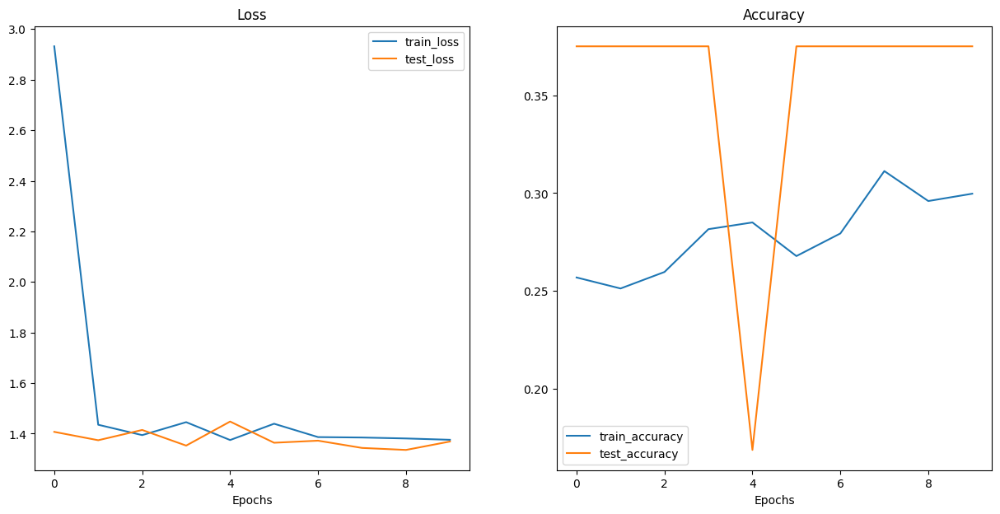

In [53]:
plot_loss_curves(results)

**AND NOW AS I CAN SEE THE TRAINING ACC AND TEST ACCURACY ARE VERY LOW (BAD) AND IT SHOULD BE BECAUSE I DIDN'T GIVE IT TIME TO TAIN AND NORE I HAVE SO MUCH DATA TO TAIN IT NOW I WILL BE USING PERTRAINED MODEL(TRANSFER LEARING ) WHICH ARE TRAINED FOR HOURS AND HOURS AND HAVE BENN TAINED ON MILLIONS OF DATA NONE LIKE ME WHO ONLY HAVE AROUND 300 MB OF DATA TO TRAIN **

# Using a pretrained MODELS


In [54]:
import torch
from torch import nn
import torch
import numpy as np
from torch.utils.data import DataLoader
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
from torchvision.models import resnet18, resnet50, densenet121, vgg11
from torchvision.models import ResNet18_Weights, ResNet50_Weights, DenseNet121_Weights, VGG11_Weights

# For Swin_T and ViT
!pip install -q timm

import timm

model1 = torchvision.models.densenet121(weights=torchvision.models.DenseNet121_Weights.IMAGENET1K_V1).to(device)
model2 = torchvision.models.resnet50(weights=torchvision.models.ResNet50_Weights.IMAGENET1K_V2).to(device)
model3 = torchvision.models.swin_t(weights=torchvision.models.Swin_T_Weights.IMAGENET1K_V1).to(device)
# Use the correct weights for the VGG11 model (without Batch Normalization)
model4 = torchvision.models.vgg11(weights=torchvision.models.VGG11_Weights.IMAGENET1K_V1).to(device)
model5 = torchvision.models.vit_b_16(weights=torchvision.models.ViT_B_16_Weights.IMAGENET1K_V1).to(device)
model6 = torchvision.models.resnet18(weights=torchvision.models.ResNet18_Weights.IMAGENET1K_V1).to(device)

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.4/42.4 kB 2.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 38.5 MB/s eta 0:00:00


Downloading: "https://download.pytorch.org/models/densenet121-a639ec97.pth" to /root/.cache/torch/hub/checkpoints/densenet121-a639ec97.pth
100%|██████████| 30.8M/30.8M [00:00<00:00, 154MB/s]
Downloading: "https://download.pytorch.org/models/resnet50-11ad3fa6.pth" to /root/.cache/torch/hub/checkpoints/resnet50-11ad3fa6.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 162MB/s]
Downloading: "https://download.pytorch.org/models/swin_t-704ceda3.pth" to /root/.cache/torch/hub/checkpoints/swin_t-704ceda3.pth
100%|██████████| 108M/108M [00:00<00:00, 144MB/s] 
Downloading: "https://download.pytorch.org/models/vgg11-8a719046.pth" to /root/.cache/torch/hub/checkpoints/vgg11-8a719046.pth
100%|██████████| 507M/507M [00:04<00:00, 122MB/s]
Downloading: "https://download.pytorch.org/models/vit_b_16-c867db91.pth" to /root/.cache/torch/hub/checkpoints/vit_b_16-c867db91.pth
100%|██████████| 330M/330M [00:02<00:00, 142MB/s]
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.c

In [55]:
weights1 = torchvision.models.DenseNet121_Weights.IMAGENET1K_V1
weights2 = torchvision.models.ResNet50_Weights.IMAGENET1K_V2
weights3 = torchvision.models.Swin_T_Weights.IMAGENET1K_V1
weights4 = torchvision.models.VGG11_BN_Weights.IMAGENET1K_V1
weights5 = torchvision.models.ViT_B_16_Weights.IMAGENET1K_V1
weights6= torchvision.models.ResNet18_Weights.IMAGENET1K_V1

In [56]:
auto1= weights1.transforms()
auto2= weights2.transforms()
auto3= weights3.transforms()
auto4= weights4.transforms()
auto5= weights5.transforms()
auto6= weights6.transforms()

In [57]:
from torchvision import datasets

# Train datasets
train_data1 = datasets.ImageFolder(root=train_dir, transform=auto1)
train_data2 = datasets.ImageFolder(root=train_dir, transform=auto2)
train_data3 = datasets.ImageFolder(root=train_dir, transform=auto3)
train_data4 = datasets.ImageFolder(root=train_dir, transform=auto4)
train_data5 = datasets.ImageFolder(root=train_dir, transform=auto5)
train_data6 = datasets.ImageFolder(root=train_dir, transform=auto6)

# Test datasets
test_data1 = datasets.ImageFolder(root=test_dir, transform=auto1)
test_data2 = datasets.ImageFolder(root=test_dir, transform=auto2)
test_data3 = datasets.ImageFolder(root=test_dir, transform=auto3)
test_data4 = datasets.ImageFolder(root=test_dir, transform=auto4)
test_data5 = datasets.ImageFolder(root=test_dir, transform=auto5)
test_data6 = datasets.ImageFolder(root=test_dir, transform=auto6)

# Validation datasets
valid_data1 = datasets.ImageFolder(root=valid_dir, transform=auto1)
valid_data2 = datasets.ImageFolder(root=valid_dir, transform=auto2)
valid_data3 = datasets.ImageFolder(root=valid_dir, transform=auto3)
valid_data4 = datasets.ImageFolder(root=valid_dir, transform=auto4)
valid_data5 = datasets.ImageFolder(root=valid_dir, transform=auto5)
valid_data6 = datasets.ImageFolder(root=valid_dir, transform=auto6)


In [58]:
len(train_data1)  , len(test_data1)

(613, 315)

In [59]:
summary(model=model6,
          input_size=(1, 3, 224, 224),
          col_names=["input_size", "output_size", "num_params", "trainable"],
          col_width=20,
          row_settings=["var_names"])

Layer (type (var_name))                  Input Shape          Output Shape         Param #              Trainable
ResNet (ResNet)                          [1, 3, 224, 224]     [1, 1000]            --                   True
├─Conv2d (conv1)                         [1, 3, 224, 224]     [1, 64, 112, 112]    9,408                True
├─BatchNorm2d (bn1)                      [1, 64, 112, 112]    [1, 64, 112, 112]    128                  True
├─ReLU (relu)                            [1, 64, 112, 112]    [1, 64, 112, 112]    --                   --
├─MaxPool2d (maxpool)                    [1, 64, 112, 112]    [1, 64, 56, 56]      --                   --
├─Sequential (layer1)                    [1, 64, 56, 56]      [1, 64, 56, 56]      --                   True
│    └─BasicBlock (0)                    [1, 64, 56, 56]      [1, 64, 56, 56]      --                   True
│    │    └─Conv2d (conv1)               [1, 64, 56, 56]      [1, 64, 56, 56]      36,864               True
│    │    └─BatchN

# Freezing layers and Adding layer for fine tunings

In [60]:
models = [model1, model2, model3, model4, model5, model6]
for i, model in enumerate(models):
    # Handle models with and without the 'features' attribute
    if hasattr(model, 'features'):
        for param in model.features.parameters():
            param.requires_grad = False
    else:
        # You might need to adjust this based on the specific model architecture
        for param in model.parameters():
            param.requires_grad = False

In [61]:

# For DenseNet121
num_ftrs = model1.classifier.in_features
model1.classifier = nn.Sequential (
    nn.Linear(512,512),
    nn.Dropout(0.2),
     nn.Linear(512,256),
    nn.Linear(256,len(class_names))
)


# For ResNet50
num_ftrs = model2.fc.in_features
model2.fc = nn.Sequential (
    nn.Linear(512,512),
    nn.Dropout(0.2),
     nn.Linear(512,256),
    nn.Linear(256,len(class_names))
)

# For Swin Transformer
num_ftrs = model3.head.in_features
model3.head = nn.Sequential (
    nn.Linear(512,512),
    nn.Dropout(0.2),
     nn.Linear(512,256),
    nn.Linear(256,len(class_names))
)


# For VGG11
num_ftrs = model4.classifier[6].in_features  # Assuming the last layer is the 6th in classifier
model4.classifier[6] = torch.nn.Linear(num_ftrs, 4)

# For Vision Transformer (ViT)
num_ftrs = model5.heads.head.in_features
model5.heads.head = torch.nn.Linear(num_ftrs, 4)
#for resnet15
num_ftrs = model6.fc.in_features
model6.fc = nn.Sequential (
    nn.Linear(512,512),
    nn.Dropout(0.2),
     nn.Linear(512,256),
    nn.Linear(256,len(class_names)), # -> len(labels) labels according to labels
)

# Now move all models to the device
model1.to(device)
model2.to(device)
model3.to(device)
model4.to(device)
model5.to(device)
model6.to(device)

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [62]:
summary(model=model6,
          input_size=(1, 3, 224, 224),
          col_names=["input_size", "output_size", "num_params", "trainable"],
          col_width=20,
          row_settings=["var_names"])

Layer (type (var_name))                  Input Shape          Output Shape         Param #              Trainable
ResNet (ResNet)                          [1, 3, 224, 224]     [1, 4]               --                   Partial
├─Conv2d (conv1)                         [1, 3, 224, 224]     [1, 64, 112, 112]    (9,408)              False
├─BatchNorm2d (bn1)                      [1, 64, 112, 112]    [1, 64, 112, 112]    (128)                False
├─ReLU (relu)                            [1, 64, 112, 112]    [1, 64, 112, 112]    --                   --
├─MaxPool2d (maxpool)                    [1, 64, 112, 112]    [1, 64, 56, 56]      --                   --
├─Sequential (layer1)                    [1, 64, 56, 56]      [1, 64, 56, 56]      --                   False
│    └─BasicBlock (0)                    [1, 64, 56, 56]      [1, 64, 56, 56]      --                   False
│    │    └─Conv2d (conv1)               [1, 64, 56, 56]      [1, 64, 56, 56]      (36,864)             False
│    │    

In [63]:
# Train datasets
BATCH_SIZE = 32

train_dataloader1 = DataLoader(train_data1, batch_size=BATCH_SIZE, shuffle=True)
train_dataloader2 = DataLoader(train_data2, batch_size=BATCH_SIZE, shuffle=True)
train_dataloader3 = DataLoader(train_data3, batch_size=BATCH_SIZE, shuffle=True)
train_dataloader4 = DataLoader(train_data4, batch_size=BATCH_SIZE, shuffle=True)
train_dataloader5 = DataLoader(train_data5, batch_size=BATCH_SIZE, shuffle=True)
train_dataloader6 = DataLoader(train_data6, batch_size=BATCH_SIZE, shuffle=True)

# Test datasets
test_dataloader1 = DataLoader(test_data1, batch_size=BATCH_SIZE, shuffle=False)
test_dataloader2 = DataLoader(test_data2, batch_size=BATCH_SIZE, shuffle=False)
test_dataloader3 = DataLoader(test_data3, batch_size=BATCH_SIZE, shuffle=False)
test_dataloader4 = DataLoader(test_data4, batch_size=BATCH_SIZE, shuffle=False)
test_dataloader5 = DataLoader(test_data5, batch_size=BATCH_SIZE, shuffle=False)
test_dataloader6 = DataLoader(test_data6, batch_size=BATCH_SIZE, shuffle=False)


In [64]:
class_names = train_data1.classes
class_names

['adenocarcinoma_left.lower.lobe_T2_N0_M0_Ib',
 'large.cell.carcinoma_left.hilum_T2_N2_M0_IIIa',
 'normal',
 'squamous.cell.carcinoma_left.hilum_T1_N2_M0_IIIa']

# Training of all the models

In [65]:
# Create train_step()
def train_step(model: torch.nn.Module,
               dataloader: torch.utils.data.DataLoader,
               loss_fn: torch.nn.Module,
               optimizer:torch.optim.Optimizer,
               device=device):
  # Put the model in train mode
  model.train()

  # Setup train loss and train accuracy values
  train_loss, train_acc = 0, 0

  # Loop through data loader data batches
  for batch, (X, y) in enumerate(dataloader):
    # Send data to the target device
    X, y = X.to(device), y.to(device)

    # 1. Forward pass
    y_pred = model(X) # output model logits

    # 2. Calculate the loss
    loss = loss_fn(y_pred, y)
    train_loss += loss.item()

    # 3. Optimizer zero grad
    optimizer.zero_grad()

    # 4. Loss backward
    loss.backward()

    # 5. Optimizer step
    optimizer.step()

    # Calculate accuracy metric
    y_pred_class = torch.argmax(torch.softmax(y_pred, dim=1), dim=1)
    train_acc += (y_pred_class==y).sum().item()/len(y_pred)

  # Adjust metrics to get average loss and accuracy per batch
  train_loss = train_loss / len(dataloader)
  train_acc = train_acc / len(dataloader)
  return train_loss, train_acc

In [66]:
# Create a test step
def test_step(model: torch.nn.Module,
              dataloader: torch.utils.data.DataLoader,
              loss_fn: torch.nn.Module,
              device=device):
  # Put model in eval mode
  model.eval()

  # Setup test loss and test accuracy values
  test_loss, test_acc = 0,  0

  # Turn on inference mode
  with torch.inference_mode():
    # Loop through DataLoader batches
    for batch, (X, y) in enumerate(dataloader):
      # Send data to the target device
      X, y = X.to(device), y.to(device)

      # 1. Forward pass
      test_pred_logits = model(X)

      # 2. Calculate the loss
      loss = loss_fn(test_pred_logits, y)
      test_loss += loss.item()

      # Calculate the accuracy
      test_pred_labels = test_pred_logits.argmax(dim=1)
      test_acc += ((test_pred_labels == y).sum().item()/len(test_pred_labels))

  # Adjust metrics to get average loss and accuracy per batch
  test_loss = test_loss / len(dataloader)
  test_acc = test_acc / len(dataloader)
  return test_loss, test_acc

In [67]:
from tqdm.auto import tqdm
import torch
import torch.nn as nn # Import the torch.nn module

# 1. Create a train function that takes in various model parameters + optimizer + dataloaders + loss function
def train(model: torch.nn.Module,
          train_dataloader,
          test_dataloader,
          optimizer,
          loss_fn: torch.nn.Module = nn.CrossEntropyLoss(),
          epochs: int = 5,
          device=device):

  # 2. Create empty results dictionary
  results = {"train_loss": [],
             "train_acc": [],
             "test_loss": [],
             "test_acc": []}

  # 3. Loop through training and testing steps for a number of epochs
  for epoch in tqdm(range(epochs)):
    train_loss, train_acc = train_step(model=model,
                                       dataloader=train_dataloader,
                                       loss_fn=loss_fn,
                                       optimizer=optimizer,
                                       device=device)
    test_loss, test_acc = test_step(model=model,
                                    dataloader=test_dataloader,
                                    loss_fn=loss_fn,
                                    device=device)

    # 4. Print out what's happening
    print(f"Epoch: {epoch} | Train loss: {train_loss:.4f} | Train acc: {train_acc:.4f} | Test loss: {test_loss:.4f} | Test acc: {test_acc:.4f}")

    # 5. Update results dictionary
    results["train_loss"].append(train_loss)
    results["train_acc"].append(train_acc)
    results["test_loss"].append(test_loss)
    results["test_acc"].append(test_acc)

  # 6. Return the filled results at the end of the epochs
  return results

In [68]:
# Compile the model with Torch 2.0
model1 = torch.compile(model1)
model2 = torch.compile(model2)
model3 = torch.compile(model3)
model4 = torch.compile(model4)
model5 = torch.compile(model5)
model6 = torch.compile(model6)

In [69]:
!pip install triton

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 209.4/209.4 MB 6.0 MB/s eta 0:00:00


In [70]:
!export TORCH_INDUCTOR_USE_TRITON=0

In [71]:
import torch._dynamo
torch._dynamo.config.suppress_errors = True

In [72]:
NUM_EPOCHS = 15

# Start the timer
from timeit import default_timer as timer
start_time = timer()
optimizer = torch.optim.Adam(model1.parameters(), lr=0.001)
loss_fn = nn.CrossEntropyLoss()

model_1_results = train(model=model1,
                        train_dataloader=train_dataloader1,
                        test_dataloader=test_dataloader1,
                        optimizer=optimizer,
                        loss_fn=loss_fn,
                        epochs=NUM_EPOCHS)

# End the timer and print out how long it took
end_time = timer()
print(f"Total training time: {end_time-start_time:.3f} seconds")

  0%|          | 0/20 [00:00<?, ?it/s]

W0907 15:49:59.641000 135118222303872 torch/_dynamo/convert_frame.py:1009] WON'T CONVERT forward /usr/local/lib/python3.10/dist-packages/torchvision/models/densenet.py line 212 
W0907 15:49:59.641000 135118222303872 torch/_dynamo/convert_frame.py:1009] due to: 
W0907 15:49:59.641000 135118222303872 torch/_dynamo/convert_frame.py:1009] Traceback (most recent call last):
W0907 15:49:59.641000 135118222303872 torch/_dynamo/convert_frame.py:1009]   File "/usr/local/lib/python3.10/dist-packages/torch/_dynamo/convert_frame.py", line 948, in __call__
W0907 15:49:59.641000 135118222303872 torch/_dynamo/convert_frame.py:1009]     result = self._inner_convert(
W0907 15:49:59.641000 135118222303872 torch/_dynamo/convert_frame.py:1009]   File "/usr/local/lib/python3.10/dist-packages/torch/_dynamo/convert_frame.py", line 472, in __call__
W0907 15:49:59.641000 135118222303872 torch/_dynamo/convert_frame.py:1009]     return _compile(
W0907 15:49:59.641000 135118222303872 torch/_dynamo/convert_frame.p

Epoch: 0 | Train loss: 1.3117 | Train acc: 0.3731 | Test loss: 1.1598 | Test acc: 0.4414
Epoch: 1 | Train loss: 1.0509 | Train acc: 0.5597 | Test loss: 1.0453 | Test acc: 0.5434
Epoch: 2 | Train loss: 0.9470 | Train acc: 0.6331 | Test loss: 0.9715 | Test acc: 0.5808
Epoch: 3 | Train loss: 0.8610 | Train acc: 0.6509 | Test loss: 0.9223 | Test acc: 0.6144
Epoch: 4 | Train loss: 0.8013 | Train acc: 0.6959 | Test loss: 0.9404 | Test acc: 0.5020
Epoch: 5 | Train loss: 0.7356 | Train acc: 0.7562 | Test loss: 0.8942 | Test acc: 0.6015
Epoch: 6 | Train loss: 0.7188 | Train acc: 0.7369 | Test loss: 0.8938 | Test acc: 0.5829
Epoch: 7 | Train loss: 0.6624 | Train acc: 0.7728 | Test loss: 0.8685 | Test acc: 0.6081
Epoch: 8 | Train loss: 0.6545 | Train acc: 0.7441 | Test loss: 0.8728 | Test acc: 0.5917
Epoch: 9 | Train loss: 0.6347 | Train acc: 0.7544 | Test loss: 0.8478 | Test acc: 0.6206
Epoch: 10 | Train loss: 0.5924 | Train acc: 0.7978 | Test loss: 0.8581 | Test acc: 0.6124
Epoch: 11 | Train lo

In [73]:

start_time = timer()
optimizer = torch.optim.Adam(model2.parameters(), lr=0.001)
loss_fn = nn.CrossEntropyLoss()

model_2_results = train(model=model2,
                        train_dataloader=train_dataloader2,
                        test_dataloader=test_dataloader2,
                        optimizer=optimizer,
                        loss_fn=loss_fn,
                        epochs=NUM_EPOCHS)

# End the timer and print out how long it took
end_time = timer()
print(f"Total training time: {end_time-start_time:.3f} seconds")

  0%|          | 0/20 [00:00<?, ?it/s]

W0907 15:53:50.111000 135118222303872 torch/_dynamo/convert_frame.py:1009] WON'T CONVERT forward /usr/local/lib/python3.10/dist-packages/torchvision/models/resnet.py line 284 
W0907 15:53:50.111000 135118222303872 torch/_dynamo/convert_frame.py:1009] due to: 
W0907 15:53:50.111000 135118222303872 torch/_dynamo/convert_frame.py:1009] Traceback (most recent call last):
W0907 15:53:50.111000 135118222303872 torch/_dynamo/convert_frame.py:1009]   File "/usr/local/lib/python3.10/dist-packages/torch/_dynamo/convert_frame.py", line 948, in __call__
W0907 15:53:50.111000 135118222303872 torch/_dynamo/convert_frame.py:1009]     result = self._inner_convert(
W0907 15:53:50.111000 135118222303872 torch/_dynamo/convert_frame.py:1009]   File "/usr/local/lib/python3.10/dist-packages/torch/_dynamo/convert_frame.py", line 472, in __call__
W0907 15:53:50.111000 135118222303872 torch/_dynamo/convert_frame.py:1009]     return _compile(
W0907 15:53:50.111000 135118222303872 torch/_dynamo/convert_frame.py:

Epoch: 0 | Train loss: 1.2562 | Train acc: 0.4831 | Test loss: 1.1975 | Test acc: 0.5242
Epoch: 1 | Train loss: 1.0471 | Train acc: 0.6775 | Test loss: 1.1170 | Test acc: 0.5734
Epoch: 2 | Train loss: 0.9207 | Train acc: 0.7137 | Test loss: 1.0211 | Test acc: 0.6183
Epoch: 3 | Train loss: 0.8311 | Train acc: 0.7309 | Test loss: 0.9562 | Test acc: 0.5819
Epoch: 4 | Train loss: 0.7710 | Train acc: 0.7581 | Test loss: 0.9187 | Test acc: 0.6007
Epoch: 5 | Train loss: 0.7055 | Train acc: 0.7909 | Test loss: 0.9109 | Test acc: 0.5993
Epoch: 6 | Train loss: 0.6736 | Train acc: 0.8175 | Test loss: 0.8748 | Test acc: 0.5876
Epoch: 7 | Train loss: 0.6368 | Train acc: 0.8228 | Test loss: 0.8796 | Test acc: 0.5939
Epoch: 8 | Train loss: 0.5879 | Train acc: 0.8369 | Test loss: 0.8686 | Test acc: 0.5814
Epoch: 9 | Train loss: 0.5798 | Train acc: 0.8525 | Test loss: 0.8532 | Test acc: 0.6118
Epoch: 10 | Train loss: 0.5349 | Train acc: 0.8844 | Test loss: 0.8320 | Test acc: 0.6044
Epoch: 11 | Train lo

In [74]:
start_time = timer()
optimizer = torch.optim.Adam(model3.parameters(), lr=0.001)
loss_fn = nn.CrossEntropyLoss()

model_3_results = train(model=model3,
                        train_dataloader=train_dataloader3,
                        test_dataloader=test_dataloader3,
                        optimizer=optimizer,
                        loss_fn=loss_fn,
                        epochs=NUM_EPOCHS)

end_time = timer()
print(f"Total training time: {end_time-start_time:.3f} seconds")

Epoch: 0 | Train loss: 1.1879 | Train acc: 0.4528 | Test loss: 0.9819 | Test acc: 0.5603
Epoch: 1 | Train loss: 0.9332 | Train acc: 0.5778 | Test loss: 0.9105 | Test acc: 0.5484
Epoch: 2 | Train loss: 0.8394 | Train acc: 0.6491 | Test loss: 0.8777 | Test acc: 0.5753
Epoch: 3 | Train loss: 0.7512 | Train acc: 0.7063 | Test loss: 0.8711 | Test acc: 0.5828
Epoch: 4 | Train loss: 0.7481 | Train acc: 0.6763 | Test loss: 0.8540 | Test acc: 0.5615
Epoch: 5 | Train loss: 0.6802 | Train acc: 0.7362 | Test loss: 0.8435 | Test acc: 0.5870
Epoch: 6 | Train loss: 0.6422 | Train acc: 0.7547 | Test loss: 0.8270 | Test acc: 0.6083
Epoch: 7 | Train loss: 0.6421 | Train acc: 0.7425 | Test loss: 0.8307 | Test acc: 0.6021
Epoch: 8 | Train loss: 0.6228 | Train acc: 0.7597 | Test loss: 0.8592 | Test acc: 0.5998
Epoch: 9 | Train loss: 0.6025 | Train acc: 0.7650 | Test loss: 0.8393 | Test acc: 0.6228
Epoch: 10 | Train loss: 0.5760 | Train acc: 0.8016 | Test loss: 0.8134 | Test acc: 0.6271
Epoch: 11 | Train lo

In [75]:
start_time = timer()
optimizer = torch.optim.Adam(model4.parameters(), lr=0.001)
loss_fn = nn.CrossEntropyLoss()

model_4_results = train(model=model4,
                        train_dataloader=train_dataloader4,
                        test_dataloader=test_dataloader4,
                        optimizer=optimizer,
                        loss_fn=loss_fn,
                        epochs=NUM_EPOCHS)

end_time = timer()
print(f"Total training time: {end_time-start_time:.3f} seconds")

  0%|          | 0/20 [00:00<?, ?it/s]

W0907 16:01:36.488000 135118222303872 torch/_dynamo/convert_frame.py:1009] WON'T CONVERT forward /usr/local/lib/python3.10/dist-packages/torchvision/models/vgg.py line 65 
W0907 16:01:36.488000 135118222303872 torch/_dynamo/convert_frame.py:1009] due to: 
W0907 16:01:36.488000 135118222303872 torch/_dynamo/convert_frame.py:1009] Traceback (most recent call last):
W0907 16:01:36.488000 135118222303872 torch/_dynamo/convert_frame.py:1009]   File "/usr/local/lib/python3.10/dist-packages/torch/_dynamo/convert_frame.py", line 948, in __call__
W0907 16:01:36.488000 135118222303872 torch/_dynamo/convert_frame.py:1009]     result = self._inner_convert(
W0907 16:01:36.488000 135118222303872 torch/_dynamo/convert_frame.py:1009]   File "/usr/local/lib/python3.10/dist-packages/torch/_dynamo/convert_frame.py", line 472, in __call__
W0907 16:01:36.488000 135118222303872 torch/_dynamo/convert_frame.py:1009]     return _compile(
W0907 16:01:36.488000 135118222303872 torch/_dynamo/convert_frame.py:1009

Epoch: 0 | Train loss: 1.4220 | Train acc: 0.4697 | Test loss: 1.2861 | Test acc: 0.4860
Epoch: 1 | Train loss: 0.8664 | Train acc: 0.7031 | Test loss: 0.8344 | Test acc: 0.6226
Epoch: 2 | Train loss: 0.6280 | Train acc: 0.8228 | Test loss: 0.9322 | Test acc: 0.5895
Epoch: 3 | Train loss: 0.3493 | Train acc: 0.9056 | Test loss: 1.9136 | Test acc: 0.6208
Epoch: 4 | Train loss: 0.2330 | Train acc: 0.9547 | Test loss: 4.0192 | Test acc: 0.4935
Epoch: 5 | Train loss: 0.4808 | Train acc: 0.9228 | Test loss: 9.5338 | Test acc: 0.3523
Epoch: 6 | Train loss: 1.1027 | Train acc: 0.8962 | Test loss: 7.6481 | Test acc: 0.5437
Epoch: 7 | Train loss: 0.3289 | Train acc: 0.9531 | Test loss: 6.1346 | Test acc: 0.6779
Epoch: 8 | Train loss: 0.4167 | Train acc: 0.9547 | Test loss: 4.1669 | Test acc: 0.6817
Epoch: 9 | Train loss: 0.6703 | Train acc: 0.9469 | Test loss: 11.7355 | Test acc: 0.4546
Epoch: 10 | Train loss: 0.4499 | Train acc: 0.9641 | Test loss: 10.3999 | Test acc: 0.5924
Epoch: 11 | Train 

In [76]:
start_time = timer()
optimizer = torch.optim.Adam(model5.parameters(), lr=0.001)
loss_fn = nn.CrossEntropyLoss()

model_5_results = train(model=model5,
                        train_dataloader=train_dataloader5,
                        test_dataloader=test_dataloader5,
                        optimizer=optimizer,
                        loss_fn=loss_fn,
                        epochs=NUM_EPOCHS)

end_time = timer()
print(f"Total training time: {end_time-start_time:.3f} seconds")

  0%|          | 0/20 [00:00<?, ?it/s]

W0907 16:05:02.491000 135118222303872 torch/_dynamo/convert_frame.py:1009] WON'T CONVERT forward /usr/local/lib/python3.10/dist-packages/torchvision/models/vision_transformer.py line 289 
W0907 16:05:02.491000 135118222303872 torch/_dynamo/convert_frame.py:1009] due to: 
W0907 16:05:02.491000 135118222303872 torch/_dynamo/convert_frame.py:1009] Traceback (most recent call last):
W0907 16:05:02.491000 135118222303872 torch/_dynamo/convert_frame.py:1009]   File "/usr/local/lib/python3.10/dist-packages/torch/_dynamo/convert_frame.py", line 948, in __call__
W0907 16:05:02.491000 135118222303872 torch/_dynamo/convert_frame.py:1009]     result = self._inner_convert(
W0907 16:05:02.491000 135118222303872 torch/_dynamo/convert_frame.py:1009]   File "/usr/local/lib/python3.10/dist-packages/torch/_dynamo/convert_frame.py", line 472, in __call__
W0907 16:05:02.491000 135118222303872 torch/_dynamo/convert_frame.py:1009]     return _compile(
W0907 16:05:02.491000 135118222303872 torch/_dynamo/conve

Epoch: 0 | Train loss: 1.1945 | Train acc: 0.4631 | Test loss: 1.0065 | Test acc: 0.5247
Epoch: 1 | Train loss: 0.8598 | Train acc: 0.6438 | Test loss: 0.9128 | Test acc: 0.5965
Epoch: 2 | Train loss: 0.7384 | Train acc: 0.7009 | Test loss: 0.8509 | Test acc: 0.6126
Epoch: 3 | Train loss: 0.6808 | Train acc: 0.7362 | Test loss: 0.8258 | Test acc: 0.6368
Epoch: 4 | Train loss: 0.6321 | Train acc: 0.7556 | Test loss: 0.8192 | Test acc: 0.6226
Epoch: 5 | Train loss: 0.5855 | Train acc: 0.7906 | Test loss: 0.8209 | Test acc: 0.5904
Epoch: 6 | Train loss: 0.5569 | Train acc: 0.7956 | Test loss: 0.7757 | Test acc: 0.6834
Epoch: 7 | Train loss: 0.5365 | Train acc: 0.8019 | Test loss: 0.7710 | Test acc: 0.6618
Epoch: 8 | Train loss: 0.5035 | Train acc: 0.8447 | Test loss: 0.7557 | Test acc: 0.6860
Epoch: 9 | Train loss: 0.4722 | Train acc: 0.8516 | Test loss: 0.7475 | Test acc: 0.6811
Epoch: 10 | Train loss: 0.4559 | Train acc: 0.8588 | Test loss: 0.7552 | Test acc: 0.6507
Epoch: 11 | Train lo

In [77]:
start_time = timer()
optimizer = torch.optim.Adam(model6.parameters(), lr=0.001)
loss_fn = nn.CrossEntropyLoss()

model_6_results = train(model=model6,
                        train_dataloader=train_dataloader6,
                        test_dataloader=test_dataloader6,
                        optimizer=optimizer,
                        loss_fn=loss_fn,
                        epochs=NUM_EPOCHS)

end_time = timer()
print(f"Total training time: {end_time-start_time:.3f} seconds")

  0%|          | 0/20 [00:00<?, ?it/s]

W0907 16:11:14.120000 135118222303872 torch/_dynamo/convert_frame.py:1009] WON'T CONVERT forward /usr/local/lib/python3.10/dist-packages/torchvision/models/resnet.py line 89 
W0907 16:11:14.120000 135118222303872 torch/_dynamo/convert_frame.py:1009] due to: 
W0907 16:11:14.120000 135118222303872 torch/_dynamo/convert_frame.py:1009] Traceback (most recent call last):
W0907 16:11:14.120000 135118222303872 torch/_dynamo/convert_frame.py:1009]   File "/usr/local/lib/python3.10/dist-packages/torch/_dynamo/convert_frame.py", line 948, in __call__
W0907 16:11:14.120000 135118222303872 torch/_dynamo/convert_frame.py:1009]     result = self._inner_convert(
W0907 16:11:14.120000 135118222303872 torch/_dynamo/convert_frame.py:1009]   File "/usr/local/lib/python3.10/dist-packages/torch/_dynamo/convert_frame.py", line 472, in __call__
W0907 16:11:14.120000 135118222303872 torch/_dynamo/convert_frame.py:1009]     return _compile(
W0907 16:11:14.120000 135118222303872 torch/_dynamo/convert_frame.py:1

Epoch: 0 | Train loss: 1.2069 | Train acc: 0.4437 | Test loss: 1.2541 | Test acc: 0.4434
Epoch: 1 | Train loss: 0.8098 | Train acc: 0.6419 | Test loss: 0.9489 | Test acc: 0.5142
Epoch: 2 | Train loss: 0.6744 | Train acc: 0.7291 | Test loss: 1.0080 | Test acc: 0.5476
Epoch: 3 | Train loss: 0.5727 | Train acc: 0.7906 | Test loss: 1.2680 | Test acc: 0.5475
Epoch: 4 | Train loss: 0.6067 | Train acc: 0.7378 | Test loss: 1.1043 | Test acc: 0.5925
Epoch: 5 | Train loss: 0.4472 | Train acc: 0.8181 | Test loss: 1.0582 | Test acc: 0.5898
Epoch: 6 | Train loss: 0.3489 | Train acc: 0.8356 | Test loss: 0.9530 | Test acc: 0.6101
Epoch: 7 | Train loss: 0.3778 | Train acc: 0.8416 | Test loss: 1.1446 | Test acc: 0.6002
Epoch: 8 | Train loss: 0.3659 | Train acc: 0.8559 | Test loss: 1.1552 | Test acc: 0.5953
Epoch: 9 | Train loss: 0.3420 | Train acc: 0.8641 | Test loss: 1.0805 | Test acc: 0.6240
Epoch: 10 | Train loss: 0.4278 | Train acc: 0.8391 | Test loss: 1.5940 | Test acc: 0.5634
Epoch: 11 | Train lo

In [86]:
for i in range(1, 6):
  result_name = f'model_{i}_results'

  # Check if the variable exists in the global scope
  if result_name in globals():
    # Check if the variable is a dictionary and contains the required keys
    if isinstance(globals()[result_name], dict) and 'train_accuracy' in globals()[result_name] and 'test_accuracy' in globals()[result_name]:
      train_acc = globals()[result_name]['train_accuracy']
      test_acc = globals()[result_name]['test_accuracy']

      writer = SummaryWriter(f'runs/model_{i}')
      writer.add_scalar('Train Accuracy', train_acc, i)
      writer.add_scalar('Test Accuracy', test_acc, i)
      writer.close()
    else:
      print(f"Variable '{result_name}' is not a dictionary or missing keys.")
  else:
    print(f"Variable '{result_name}' not found.")

Variable 'model_1_results' is not a dictionary or missing keys.
Variable 'model_2_results' is not a dictionary or missing keys.
Variable 'model_3_results' is not a dictionary or missing keys.
Variable 'model_4_results' is not a dictionary or missing keys.
Variable 'model_5_results' is not a dictionary or missing keys.


In [90]:
!pip install tensorboard==2.11.0


In [93]:
!pip install tensorboard==2.11.0

%load_ext tensorboard

from torch.utils.tensorboard import SummaryWriter


for i in range(0, 7):
  result_name = f'model_{i}_results'
  train_acc = globals()[result_name]['train_acc']
  test_acc = globals()[result_name]['test_acc']

  writer = SummaryWriter(f'runs/model_{i}')

  for epoch, (train_acc_epoch, test_acc_epoch) in enumerate(zip(train_acc, test_acc)):
    writer.add_scalar('Train Accuracy', train_acc_epoch, epoch)
    writer.add_scalar('Test Accuracy', test_acc_epoch, epoch)
  writer.close()

%tensorboard --logdir runs

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 10611), started 0:18:53 ago. (Use '!kill 10611' to kill it.)

<IPython.core.display.Javascript object>